<a href="https://colab.research.google.com/github/keertanaganiga/Lockdown_coding/blob/master/PIXHack.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from keras.layers import (
    Input,Dense,Reshape,Flatten,Dropout,Concatenate)
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D,Conv2DTranspose
from keras.models import  Model
from keras.optimizers import(Adam, RMSprop)



In [ ]:
from keras.layers import( Conv2D, UpSampling2D)

In [ ]:
import cv2
import os
from glob import glob
import numpy as np
import matplotlib.pyplot as plt

[**GAN HACKS**](https://github.com/soumith/ganhacks)

In [ ]:
#dataset name ="cityscapes" &&  "night2day" &&   "edges2handbags" && "edges2shoes"  "facades" &&  "maps" 

In [ ]:
###dataset download and extract####3
dataset_name ='V'
URL ="http://cmp.felk.cvut.cz/~tylecr1/facade/CMP_facade_DB_extended.zip"
URL ="http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/facades.tar.gz"
TAR_FILE ="facades.tar.gz"



In [ ]:
#!mkdir datasets
#!wget - N $URL
#!tar -zxvf $TAR_FILE -C ./datasets/
#!rm $TAR_FILE



In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

#!pwd
#!mogrify -format png ./drive/c/JPG/*jpg 

Mounted at /content/drive/


In [ ]:
#with open('/content/drive/My Drive/foo.txt', 'w') as f:
  #f.write('Hello Google Drive!')
#!cat /content/drive/My\ Drive/foo.txt

In [ ]:
#keras.optimizers.Adam(lr=0.0002, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
optimizer=Adam(0.0002,0.5)

[**Pix2PIX**](https://towardsdatascience.com/pix2pix-869c17900998)

[ADAM](https://qph.fs.quoracdn.net/main-qimg-e2d7c3670264380c730bed6de491e10f)

![alt text](https://image.slidesharecdn.com/20171017dlhacks-171019082642/95/dlhacks-perceptual-adversarial-networks-for-imagetoimage-transformation-7-638.jpg?cb=1508401655)

In [ ]:
img_row=256
img_col = 256
channels =3
img_shape=(img_row,img_col,channels)
patch= int(img_row/2**4)
disc_patch=(patch,patch,1)
dwf=64
upf =64
img_A= Input(shape=(256,256,3))
img_B =Input(shape=(256,256,3))

![alt text](https://cdn-images-1.medium.com/max/1600/1*TktHhY3l89quwJtCtVg86Q.png)

In [ ]:
def encode(inputs,filters,kernel=4,bn=True):
  d=Conv2D(filters=filters,kernel_size=kernel,strides=2,padding='same')(inputs)
  d=LeakyReLU(alpha=0.2)(d)
  if bn:
    d= BatchNormalization(momentum=0.8)(d)
    
  return d


In [ ]:
#down filter-> dwf=64 upfilter->upf=64

In [ ]:
def decode(layer_input, skip_input, filters, f_size=4, dropout_rate=0):
            """Layers used during upsampling"""
            u = UpSampling2D(size=2)(layer_input)
            #u = Conv2D(filters, kernel_size=f_size, strides=1, padding='same', activation='relu')(u)
            u = Conv2DTranspose(filters, kernel_size=f_size, strides=1, padding='same', activation='relu')(u)
            if dropout_rate:
                u = Dropout(dropout_rate)(u)
            u = BatchNormalization(momentum=0.8)(u)
            u = Concatenate()([u, skip_input])
            return u

In [ ]:
"""def decode(layer_input, skip_input, filters, f_size=4, dropout_rate=0):
            Layers used during upsampling
            u = UpSampling2D(size=2)(layer_input)
            u = Conv2D(filters, kernel_size=f_size, strides=1, padding='same', activation='relu')(u)
            if dropout_rate:
                u = Dropout(dropout_rate)(u)
            u = BatchNormalization(momentum=0.8)(u)
            u = Concatenate()([u, skip_input])
            return u"""


"def decode(layer_input, skip_input, filters, f_size=4, dropout_rate=0):\n            Layers used during upsampling\n            u = UpSampling2D(size=2)(layer_input)\n            u = Conv2D(filters, kernel_size=f_size, strides=1, padding='same', activation='relu')(u)\n            if dropout_rate:\n                u = Dropout(dropout_rate)(u)\n            u = BatchNormalization(momentum=0.8)(u)\n            u = Concatenate()([u, skip_input])\n            return u"

In [ ]:
def generator():
  inputs=Input(shape=(256,256,3))
  d0=encode(inputs,dwf,bn=False)
  d1=encode(d0,dwf*2)
  d2=encode(d1,dwf*4)
  d3=encode(d2,dwf*8)
  d4=encode(d3,dwf*8)
  d5=encode(d4,dwf*8)
  d6=encode(d5,dwf*8)
  ## upsampling##
  u1=decode(d6,d5,upf)
  u2=decode(u1,d4,upf*8)
  u3=decode(u2,d3,upf*8)
  u4=decode(u3,d2,upf*8)
  u5=decode(u4,d1,upf*4)
  u6=decode(u5,d0,upf*2)
  u7=UpSampling2D(size=2)(u6)
  out = Conv2D(channels,kernel_size=4,strides=1,padding='same',activation='sigmoid' )(u7)
  return Model(inputs,out)

In [ ]:
G=generator()

In [ ]:
G.summary()
# Input images and their conditioning images
img_A = Input(shape=img_shape)
img_B = Input(shape=img_shape)

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 128, 128, 64) 3136        input_3[0][0]                    
__________________________________________________________________________________________________
leaky_re_lu (LeakyReLU)         (None, 128, 128, 64) 0           conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 64, 64, 128)  131200      leaky_re_lu[0][0]                
_______________________________________________________________________________________

![alt text](https://cdn-images-1.medium.com/max/1600/1*O_8exW8NYPmTLjJujy-wWg.png)

In [ ]:
def descriminator():
  combined_imgs = Concatenate(axis=-1)([img_A, img_B])
  d1=encode(combined_imgs,dwf,bn=False)
  d2=encode(d1,dwf*2)
  d3=encode(d2,dwf*4)
  d4=encode(d3,dwf*8)
  validity = Conv2D(1, kernel_size=4, strides=1, padding='same')(d4)
  return Model([img_A, img_B], validity)

In [ ]:
D=descriminator()
D.summary()

Model: "functional_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
input_5 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
concatenate_6 (Concatenate)     (None, 256, 256, 6)  0           input_4[0][0]                    
                                                                 input_5[0][0]                    
__________________________________________________________________________________________________
conv2d_8 (Conv2D)               (None, 128, 128, 64) 6208        concatenate_6[0][0]   

In [ ]:

D.compile(loss='mae',
            optimizer=optimizer,
            metrics=['accuracy'])
# By conditioning on B generate a fake version of A
fake_A = G(img_B)
 # Discriminators determines validity of  condition pairs
valid = D([fake_A, img_B])

In [ ]:
#combined model LAmbda =100
combined = Model(inputs=[img_A, img_B], outputs=[valid, fake_A])
combined.summary()
combined.compile(loss=['mae', 'mae'],
                              loss_weights=[1, 10],
                              optimizer=optimizer)

Model: "functional_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
functional_1 (Functional)       (None, 256, 256, 3)  41322115    input_5[0][0]                    
__________________________________________________________________________________________________
input_4 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
functional_3 (Functional)       (None, 16, 16, 1)    2771393     functional_1[0][0]               
                                                                 input_5[0][0]         

In [ ]:

#print(fake_A.shape)
# For the combined model we will only train the generator
D.trainable = False
n_batches= 1;

In [ ]:

#image resulution for resizing
img_res=(256,256)
def imread( path):
        cv2.imread(path)

In [ ]:
##load datasets

def load_data( batch_size=1, is_testing=False):
        data_type = "train" if not is_testing else "test"
        #drivemount
        path = glob('/content/drive/My Drive/%s/%s/*' % (dataset_name, data_type))
        #path = glob('./datasets/%s/%s/*' % (dataset_name, data_type))

        batch_images = np.random.choice(path, size=batch_size)

        imgs_A = []
        imgs_B = []
        for img_path in batch_images:
            img = cv2.imread(img_path)

            h, w, _ = img.shape
            _w = int(w/2)
            img_A, img_B = img[:, :_w, :], img[:, _w:, :]

            img_A = cv2.resize(img_A, img_res)
            img_B = cv2.resize(img_B, img_res)

            # If training => do random flip
            if not is_testing and np.random.random() < 0.5:
                img_A = np.fliplr(img_A)
                img_B = np.fliplr(img_B)

            imgs_A.append(img_A)
            imgs_B.append(img_B)

        imgs_A = np.array(imgs_A)/127.5 - 1.
        imgs_B = np.array(imgs_B)/127.5 - 1.

        return imgs_A, imgs_B

In [ ]:
#load batch
def load_batch(batch_size=1, is_testing=False):
        data_type = "train" if not is_testing else "val"
        path = glob('/content/drive/My Drive/%s/%s/*' % (dataset_name, data_type))
        #path = glob('./datasets/%s/%s/*' % (dataset_name, data_type))

        n_batches = int(len(path) / batch_size)

        for i in range(n_batches-1):
            batch = path[i*batch_size:(i+1)*batch_size]
            imgs_A, imgs_B = [], []
            for img in batch:
                img = cv2.imread(img)
                h, w, _ = img.shape
                half_w = int(w/2)
                img_A = img[:, :half_w, :]
                img_B = img[:, half_w:, :]

                img_A = cv2.resize(img_A, img_res)
                img_B = cv2.resize(img_B, img_res)

                if not is_testing and np.random.random() > 0.5:
                        img_A = np.fliplr(img_A)
                        img_B = np.fliplr(img_B)

                imgs_A.append(img_A)
                imgs_B.append(img_B)

            imgs_A = np.array(imgs_A)/127.5 - 1.
            imgs_B = np.array(imgs_B)/127.5 - 1.

            yield imgs_A, imgs_B

In [ ]:
def sample_images(epoch, batch_i):
       
        r, c = 3, 3

        imgs_A, imgs_B = load_data(batch_size=3, is_testing=True)
        fake_A = G.predict(imgs_B)

        gen_imgs = np.concatenate([imgs_B, fake_A, imgs_A])

        # Rescale images 0 - 1
        gen_imgs = 0.5 * gen_imgs + 0.5

        titles = ['Condition', 'Generated', 'Original']
        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i,j].imshow(gen_imgs[cnt])
                axs[i, j].set_title(titles[i])
                axs[i,j].axis('off')
                cnt += 1
        plt.show()
        plt.close()

In [ ]:
def save_models(output_folder_path, iteration_no):
        G.save(
            os.path.join(output_folder_path, 'gen_model_{0}.h5'.format(iteration_no)))
        D.save(
            os.path.join(output_folder_path, 'dis_model_{0}.h5'.format(iteration_no)))
        combined.save(
            os.path.join(output_folder_path, 'com_model_{0}.h5'.format(iteration_no)))

In [ ]:
import datetime
output_folder_path = '/content/drive/My Drive/SAVE/'
def train( epochs, batch_size=1, sample_interval=50):
        iteration = 1
        lossGt = []
        lossDt = []
        idata = []
        start_time = datetime.datetime.now()

        # Adversarial loss ground truths
        valid = np.ones((batch_size,) + disc_patch)
        fake = np.zeros((batch_size,) + disc_patch)
        print(valid.shape)

        for epoch in range(epochs):
            for batch_i, (imgs_A, imgs_B) in enumerate(load_batch(batch_size)):

                # ---------------------
                #  Train Discriminator
                # ---------------------

                # Condition on B and generate a translated version
                fake_A = G.predict(imgs_B)
                #print(imgs_A.shape)

                # Train the discriminators (original images = real / generated = Fake)
                d_loss_real = D.train_on_batch([imgs_A, imgs_B], valid)
                d_loss_fake = D.train_on_batch([fake_A, imgs_B], fake)
                d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

                # -----------------
                #  Train Generator
                # -----------------

                # Train the generators
                g_loss = combined.train_on_batch([imgs_A, imgs_B], [valid, imgs_A])

                elapsed_time = datetime.datetime.now() - start_time
                # Plot the progress
                print ("[Epoch %d/%d] [Batch %d] [D loss: %f, acc: %3d%%] [G loss: %f] time: %s" % (epoch, epochs,
                                                                        batch_i,
                                                                        d_loss[0], 100*d_loss[1],
                                                                        g_loss[0],
                                                                        elapsed_time))
                lossGt.append(g_loss[0]) 
                lossDt.append(d_loss[0])
                ##print(lossDt)
                #print()
                iteration = (epoch%epochs) + (batch_i/n_batches)
                #print(iteration)
                
                idata.append(iteration)
                #print(idata)
                fig = plt.figure(1)
                # plt.plot(lossGt, label='GLoss')
                plt.plot(idata, lossGt, color='green',
                             label='Generator Loss')
                plt.plot(idata,lossDt ,color='blue',
                             label='Discriminator Loss')
                plt.title("pIXTrain")
                plt.xlabel(" Iteration")
                plt.ylabel("Loss")
                plt.legend()
                plt.pause(.01)
                plt.show()
                
                #ln.remove()  # remove the a rtist
                
                
                plt.draw()

                # If at save interval => save generated image samples
                if batch_i % sample_interval == 0:
                    sample_images(epoch, batch_i)
                    #save_models(output_folder_path,batch_i + 1)

                   

(3, 16, 16, 1)
[Epoch 0/200] [Batch 0] [D loss: 2.207515, acc:  49%] [G loss: 9.343049] time: 0:00:07.735596


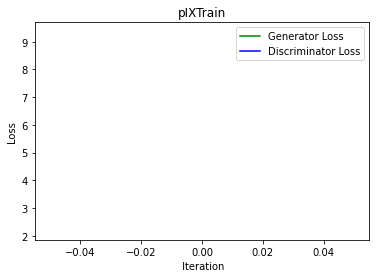

<Figure size 432x288 with 0 Axes>

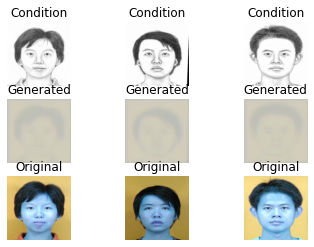

[Epoch 0/200] [Batch 1] [D loss: 2.378859, acc:  48%] [G loss: 5.495708] time: 0:00:13.719664


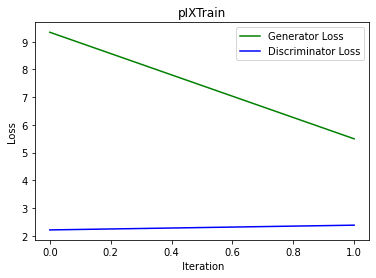

[Epoch 0/200] [Batch 2] [D loss: 1.245028, acc:  49%] [G loss: 5.769392] time: 0:00:15.952904


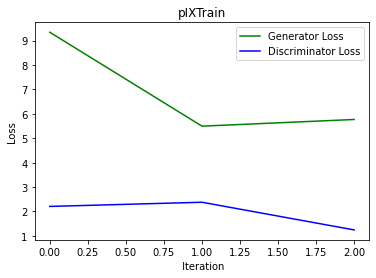

[Epoch 0/200] [Batch 3] [D loss: 1.398221, acc:  55%] [G loss: 5.474047] time: 0:00:18.458950


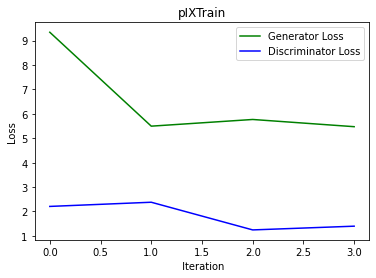

[Epoch 0/200] [Batch 4] [D loss: 1.241648, acc:  48%] [G loss: 5.592764] time: 0:00:20.918218


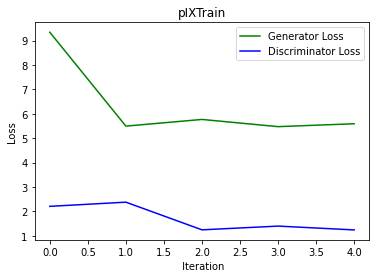

[Epoch 0/200] [Batch 5] [D loss: 1.420069, acc:  45%] [G loss: 5.741624] time: 0:00:22.980616


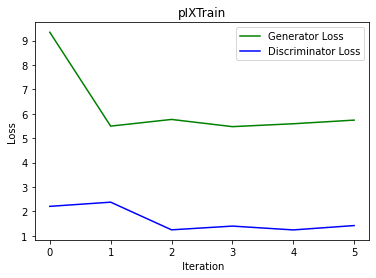

[Epoch 0/200] [Batch 6] [D loss: 1.032311, acc:  50%] [G loss: 5.823028] time: 0:00:25.179281


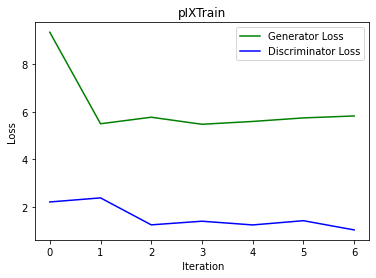

[Epoch 0/200] [Batch 7] [D loss: 0.677604, acc:  56%] [G loss: 3.863082] time: 0:00:27.077360


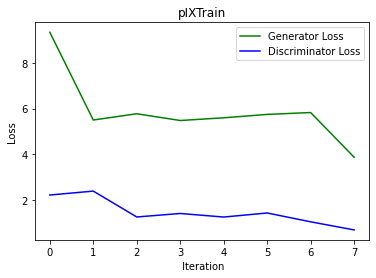

[Epoch 0/200] [Batch 8] [D loss: 0.723256, acc:  54%] [G loss: 3.885095] time: 0:00:29.440008


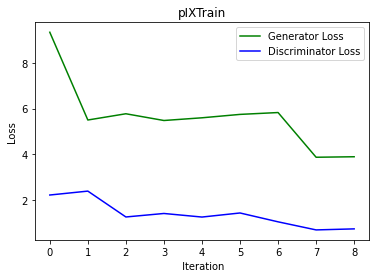

[Epoch 0/200] [Batch 9] [D loss: 0.816463, acc:  48%] [G loss: 3.433254] time: 0:00:32.064946


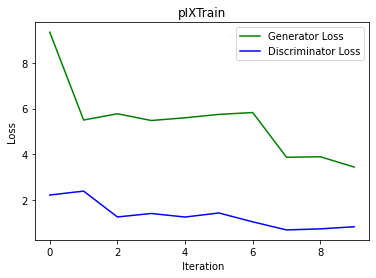

[Epoch 0/200] [Batch 10] [D loss: 0.821810, acc:  41%] [G loss: 3.339930] time: 0:00:34.417875


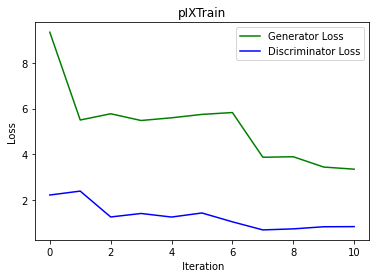

[Epoch 0/200] [Batch 11] [D loss: 0.620568, acc:  48%] [G loss: 3.129155] time: 0:00:36.827910


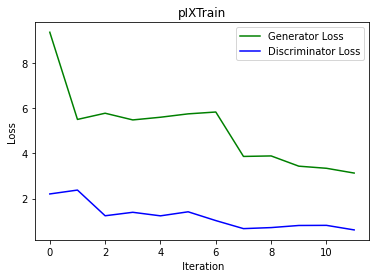

[Epoch 0/200] [Batch 12] [D loss: 0.609493, acc:  50%] [G loss: 3.233765] time: 0:00:39.339264


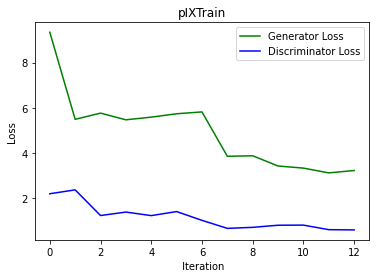

[Epoch 0/200] [Batch 13] [D loss: 0.610625, acc:  52%] [G loss: 2.859864] time: 0:00:41.522916


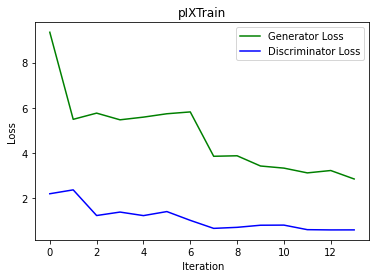

[Epoch 0/200] [Batch 14] [D loss: 0.648067, acc:  49%] [G loss: 2.813673] time: 0:00:44.043203


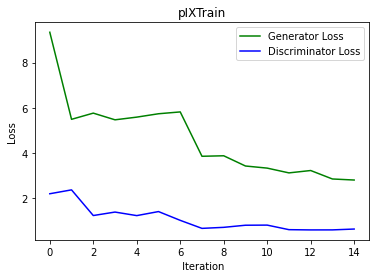

[Epoch 0/200] [Batch 15] [D loss: 0.632814, acc:  50%] [G loss: 3.107602] time: 0:00:46.576912


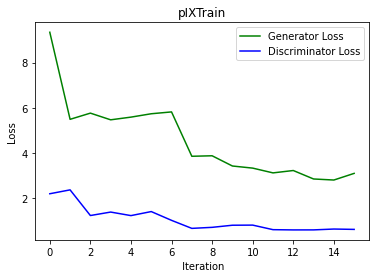

[Epoch 0/200] [Batch 16] [D loss: 0.576439, acc:  51%] [G loss: 3.367696] time: 0:00:48.710439


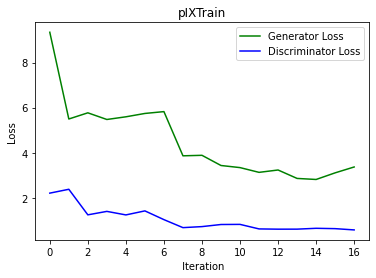

[Epoch 0/200] [Batch 17] [D loss: 0.623437, acc:  50%] [G loss: 2.659968] time: 0:00:51.479149


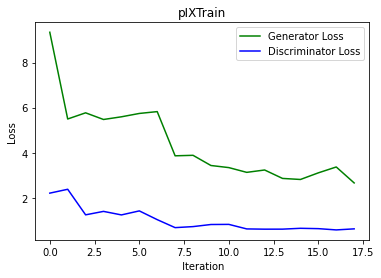

[Epoch 0/200] [Batch 18] [D loss: 0.641499, acc:  53%] [G loss: 2.707289] time: 0:00:53.641365


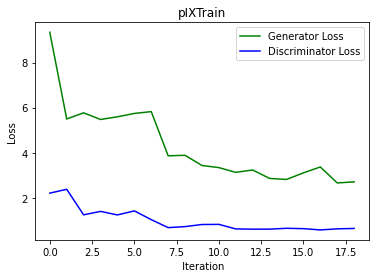

[Epoch 0/200] [Batch 19] [D loss: 0.643643, acc:  47%] [G loss: 3.859769] time: 0:00:55.908025


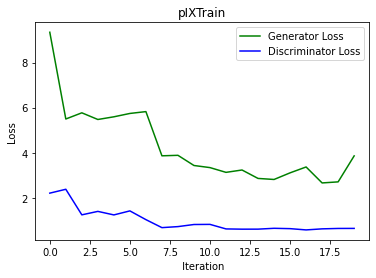

[Epoch 0/200] [Batch 20] [D loss: 0.608267, acc:  43%] [G loss: 3.015725] time: 0:00:58.402623


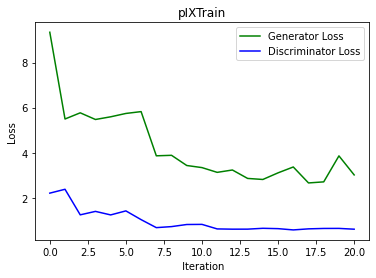

<Figure size 432x288 with 0 Axes>

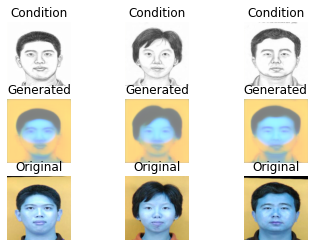

[Epoch 0/200] [Batch 21] [D loss: 0.585591, acc:  47%] [G loss: 3.317596] time: 0:01:02.439080


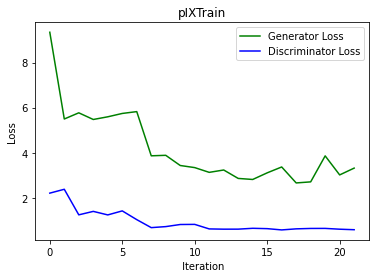

[Epoch 0/200] [Batch 22] [D loss: 0.571218, acc:  46%] [G loss: 4.276198] time: 0:01:04.922118


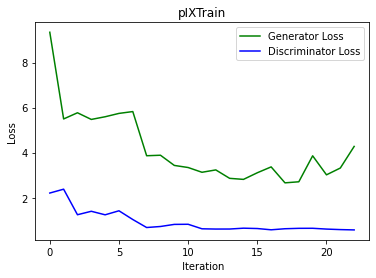

[Epoch 0/200] [Batch 23] [D loss: 0.574545, acc:  50%] [G loss: 2.954573] time: 0:01:07.410413


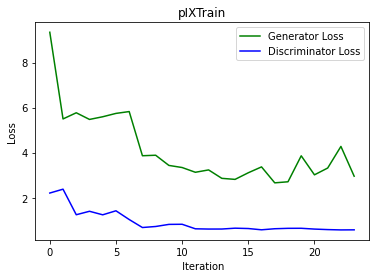

[Epoch 0/200] [Batch 24] [D loss: 0.637342, acc:  57%] [G loss: 2.697815] time: 0:01:10.073482


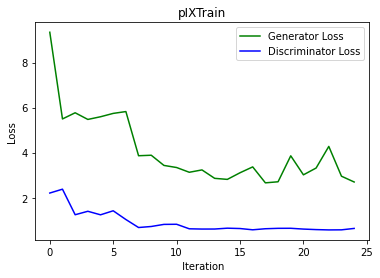

[Epoch 0/200] [Batch 25] [D loss: 0.692466, acc:  48%] [G loss: 3.594609] time: 0:01:12.393145


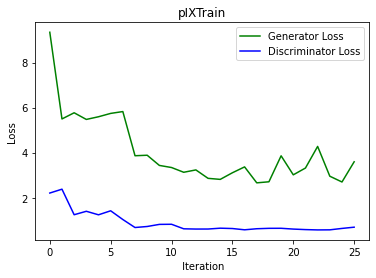

[Epoch 0/200] [Batch 26] [D loss: 0.654753, acc:  52%] [G loss: 4.671458] time: 0:01:15.340933


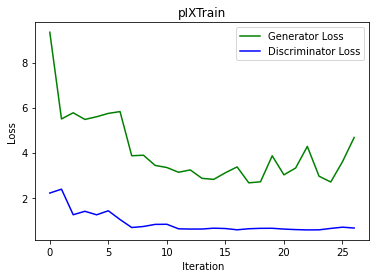

[Epoch 0/200] [Batch 27] [D loss: 0.572361, acc:  50%] [G loss: 3.760301] time: 0:01:17.797265


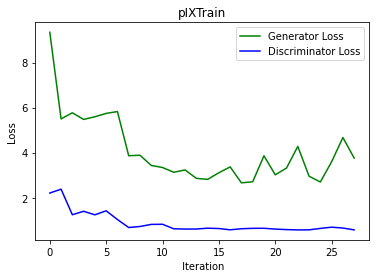

[Epoch 0/200] [Batch 28] [D loss: 0.582939, acc:  54%] [G loss: 4.498045] time: 0:01:20.229422


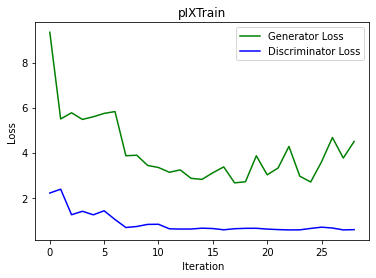

[Epoch 0/200] [Batch 29] [D loss: 0.660508, acc:  46%] [G loss: 5.248700] time: 0:01:22.600915


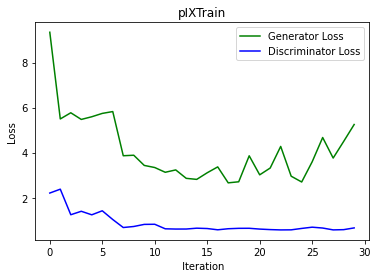

[Epoch 0/200] [Batch 30] [D loss: 0.509633, acc:  51%] [G loss: 5.009215] time: 0:01:25.085226


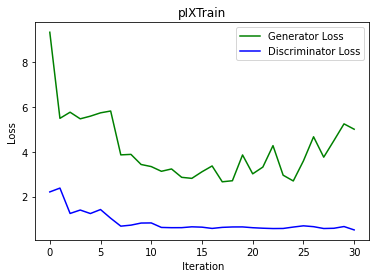

[Epoch 0/200] [Batch 31] [D loss: 0.579477, acc:  52%] [G loss: 4.345222] time: 0:01:27.777645


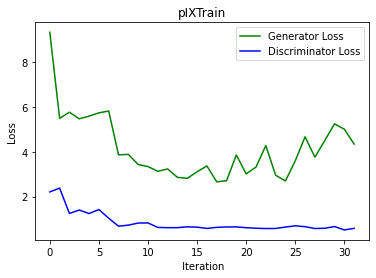

[Epoch 1/200] [Batch 0] [D loss: 0.604308, acc:  49%] [G loss: 3.979561] time: 0:01:28.256656


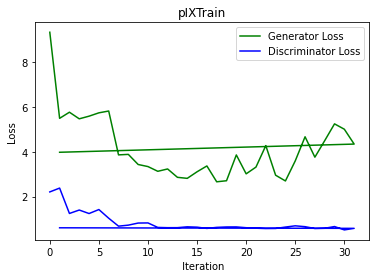

<Figure size 432x288 with 0 Axes>

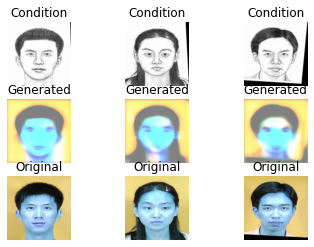

[Epoch 1/200] [Batch 1] [D loss: 0.596537, acc:  47%] [G loss: 3.141865] time: 0:01:31.176482


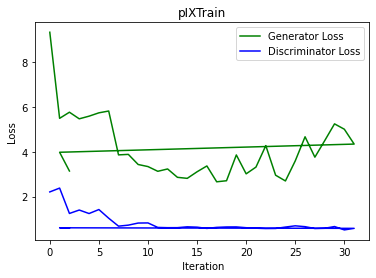

[Epoch 1/200] [Batch 2] [D loss: 0.615720, acc:  48%] [G loss: 3.857935] time: 0:01:31.664802


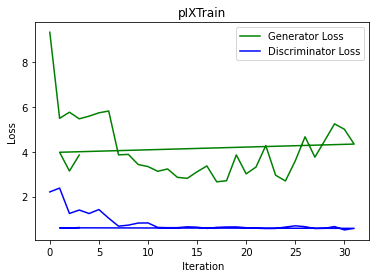

[Epoch 1/200] [Batch 3] [D loss: 0.586714, acc:  44%] [G loss: 3.782900] time: 0:01:32.140038


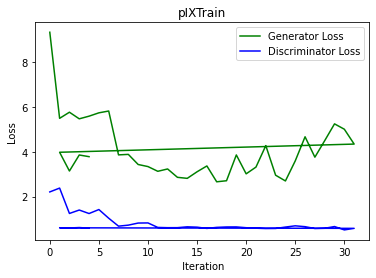

[Epoch 1/200] [Batch 4] [D loss: 0.569146, acc:  50%] [G loss: 3.067466] time: 0:01:32.617269


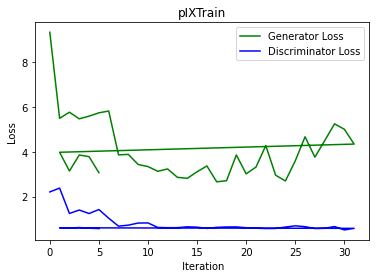

[Epoch 1/200] [Batch 5] [D loss: 0.687863, acc:  51%] [G loss: 4.654185] time: 0:01:33.096842


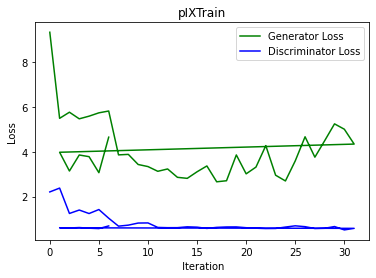

[Epoch 1/200] [Batch 6] [D loss: 0.684567, acc:  47%] [G loss: 5.085408] time: 0:01:33.584038


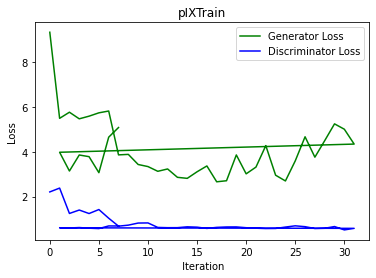

[Epoch 1/200] [Batch 7] [D loss: 0.685791, acc:  42%] [G loss: 3.005885] time: 0:01:34.065017


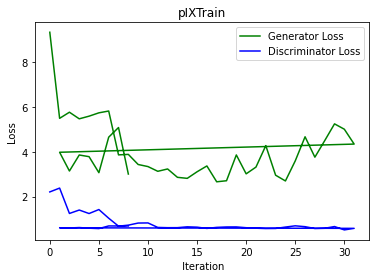

[Epoch 1/200] [Batch 8] [D loss: 0.550588, acc:  48%] [G loss: 3.390100] time: 0:01:34.561045


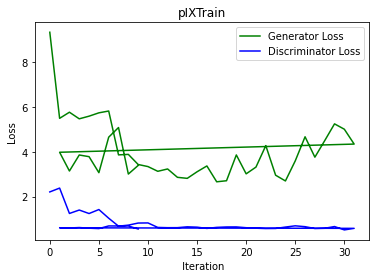

[Epoch 1/200] [Batch 9] [D loss: 0.558441, acc:  46%] [G loss: 2.702447] time: 0:01:35.040927


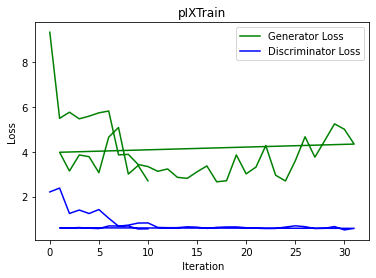

[Epoch 1/200] [Batch 10] [D loss: 0.618505, acc:  47%] [G loss: 3.104686] time: 0:01:35.538555


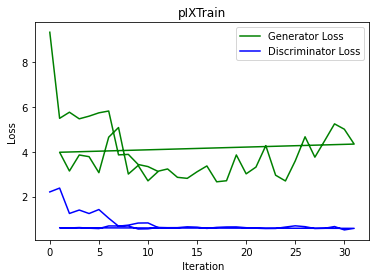

[Epoch 1/200] [Batch 11] [D loss: 0.646213, acc:  51%] [G loss: 3.031453] time: 0:01:36.019084


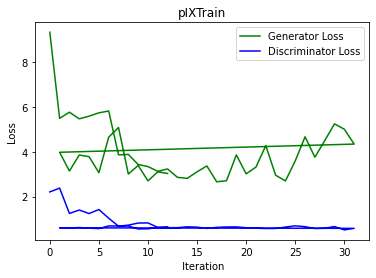

[Epoch 1/200] [Batch 12] [D loss: 0.572310, acc:  47%] [G loss: 2.930880] time: 0:01:36.650568


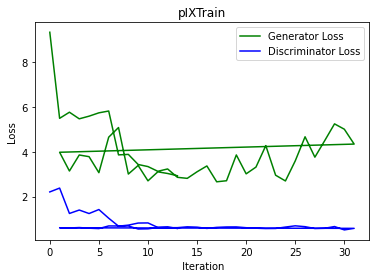

[Epoch 1/200] [Batch 13] [D loss: 0.538812, acc:  47%] [G loss: 2.515886] time: 0:01:37.128964


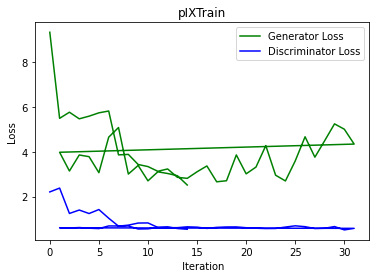

[Epoch 1/200] [Batch 14] [D loss: 0.544794, acc:  56%] [G loss: 2.619587] time: 0:01:37.619172


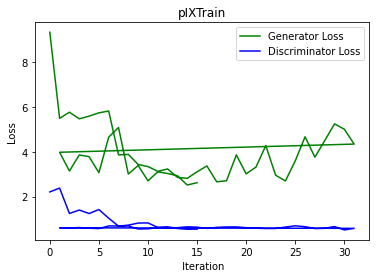

[Epoch 1/200] [Batch 15] [D loss: 0.697763, acc:  49%] [G loss: 2.784547] time: 0:01:38.101629


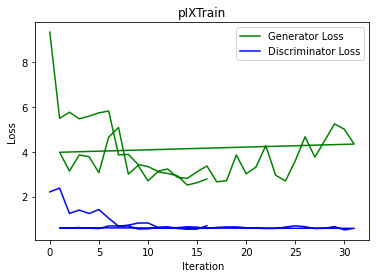

[Epoch 1/200] [Batch 16] [D loss: 0.581909, acc:  56%] [G loss: 3.199460] time: 0:01:38.597860


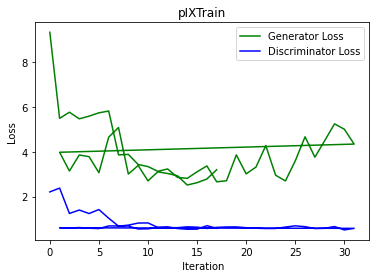

[Epoch 1/200] [Batch 17] [D loss: 0.662080, acc:  51%] [G loss: 2.608231] time: 0:01:39.081388


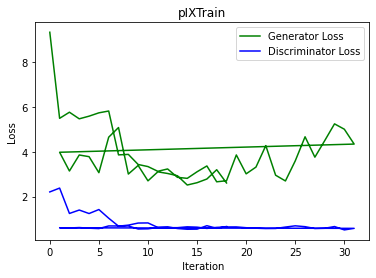

[Epoch 1/200] [Batch 18] [D loss: 0.529931, acc:  46%] [G loss: 2.396696] time: 0:01:39.565439


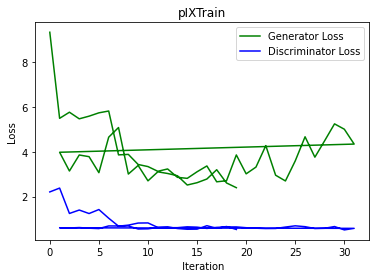

[Epoch 1/200] [Batch 19] [D loss: 0.585623, acc:  49%] [G loss: 3.472982] time: 0:01:40.047873


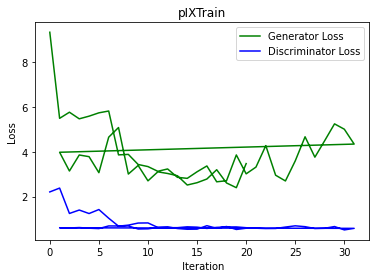

[Epoch 1/200] [Batch 20] [D loss: 0.537772, acc:  51%] [G loss: 2.957898] time: 0:01:40.549118


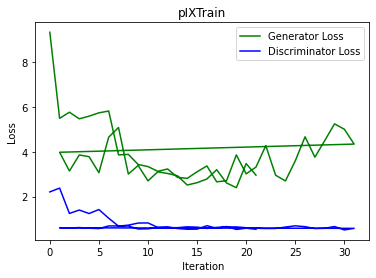

<Figure size 432x288 with 0 Axes>

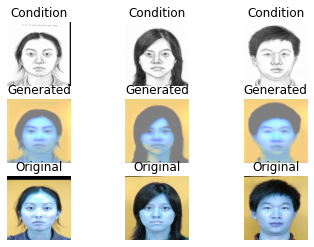

[Epoch 1/200] [Batch 21] [D loss: 0.587587, acc:  47%] [G loss: 3.110047] time: 0:01:43.403932


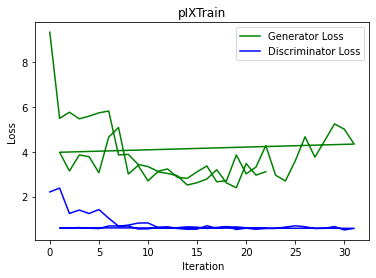

[Epoch 1/200] [Batch 22] [D loss: 0.519376, acc:  56%] [G loss: 4.188108] time: 0:01:43.894369


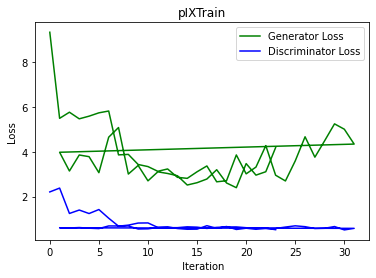

[Epoch 1/200] [Batch 23] [D loss: 0.578358, acc:  55%] [G loss: 2.870916] time: 0:01:44.378230


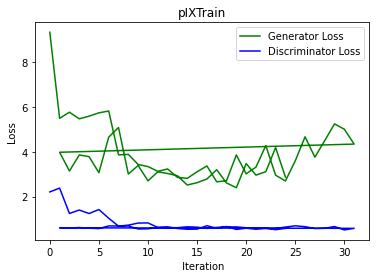

[Epoch 1/200] [Batch 24] [D loss: 0.626063, acc:  59%] [G loss: 2.722252] time: 0:01:44.877075


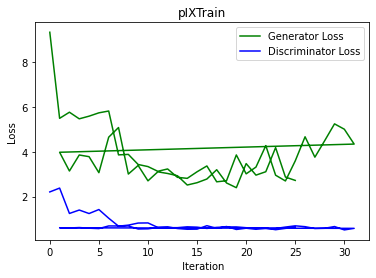

[Epoch 1/200] [Batch 25] [D loss: 0.581782, acc:  49%] [G loss: 3.324797] time: 0:01:45.362876


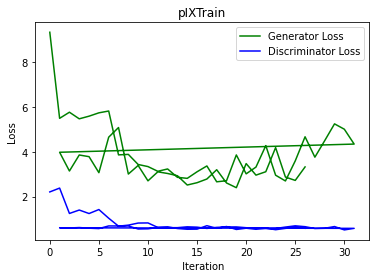

[Epoch 1/200] [Batch 26] [D loss: 0.480138, acc:  59%] [G loss: 4.628796] time: 0:01:45.845000


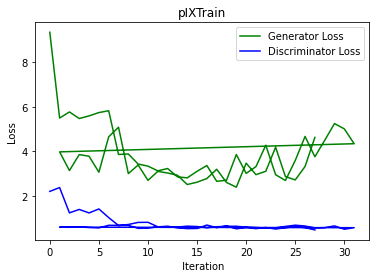

[Epoch 1/200] [Batch 27] [D loss: 0.554793, acc:  50%] [G loss: 3.380720] time: 0:01:46.325697


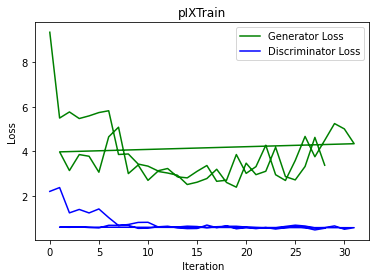

[Epoch 1/200] [Batch 28] [D loss: 0.540671, acc:  57%] [G loss: 4.209145] time: 0:01:46.809550


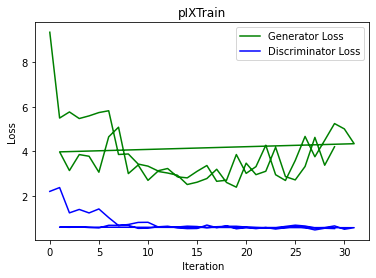

[Epoch 1/200] [Batch 29] [D loss: 0.603060, acc:  54%] [G loss: 4.828796] time: 0:01:47.288866


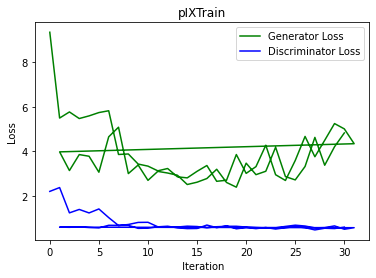

[Epoch 1/200] [Batch 30] [D loss: 0.524126, acc:  53%] [G loss: 4.855267] time: 0:01:47.768501


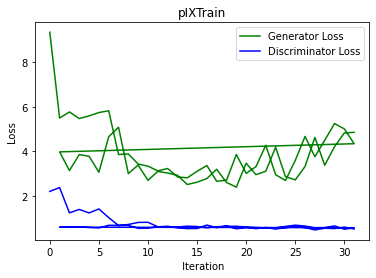

[Epoch 1/200] [Batch 31] [D loss: 0.547545, acc:  51%] [G loss: 4.186143] time: 0:01:48.244503


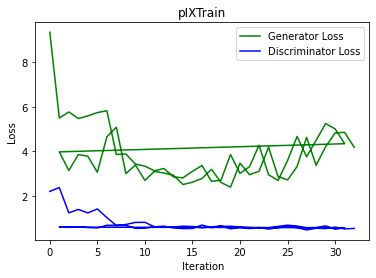

[Epoch 2/200] [Batch 0] [D loss: 0.536081, acc:  51%] [G loss: 3.801507] time: 0:01:48.730173


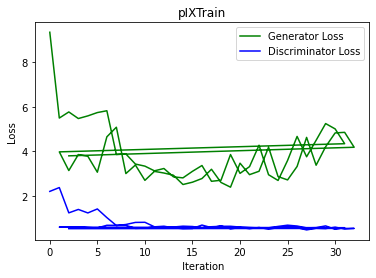

<Figure size 432x288 with 0 Axes>

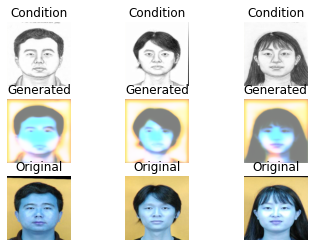

[Epoch 2/200] [Batch 1] [D loss: 0.579894, acc:  41%] [G loss: 3.110018] time: 0:01:51.109395


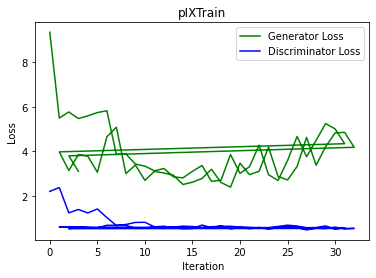

[Epoch 2/200] [Batch 2] [D loss: 0.510876, acc:  52%] [G loss: 3.873170] time: 0:01:51.591599


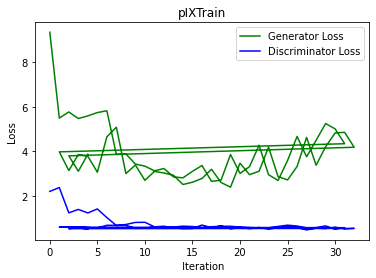

[Epoch 2/200] [Batch 3] [D loss: 0.611570, acc:  52%] [G loss: 3.553169] time: 0:01:52.073360


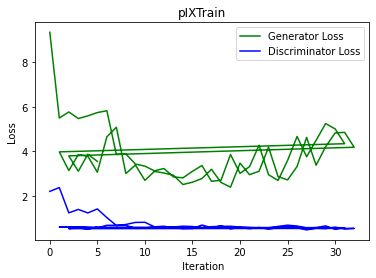

[Epoch 2/200] [Batch 4] [D loss: 0.667426, acc:  54%] [G loss: 3.036441] time: 0:01:52.552840


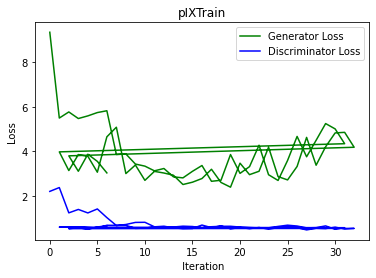

[Epoch 2/200] [Batch 5] [D loss: 0.685641, acc:  48%] [G loss: 4.730389] time: 0:01:53.048440


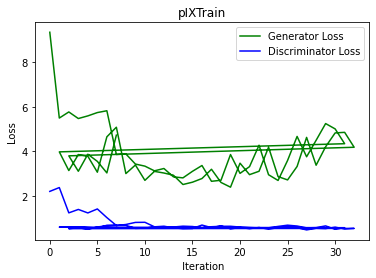

[Epoch 2/200] [Batch 6] [D loss: 0.582272, acc:  52%] [G loss: 5.017278] time: 0:01:53.536668


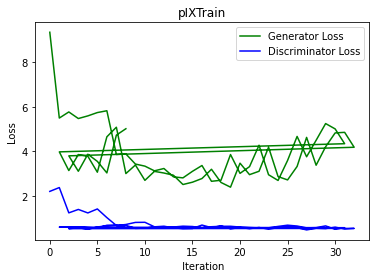

[Epoch 2/200] [Batch 7] [D loss: 0.584295, acc:  54%] [G loss: 2.972397] time: 0:01:54.025258


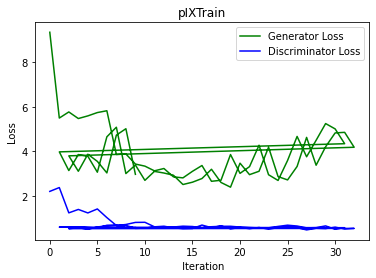

[Epoch 2/200] [Batch 8] [D loss: 0.606239, acc:  48%] [G loss: 3.423895] time: 0:01:54.503634


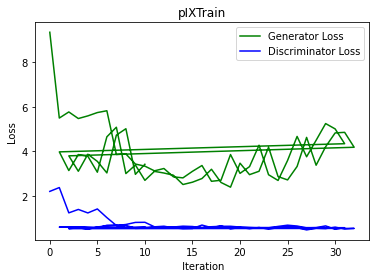

[Epoch 2/200] [Batch 9] [D loss: 0.575497, acc:  48%] [G loss: 2.656704] time: 0:01:54.987260


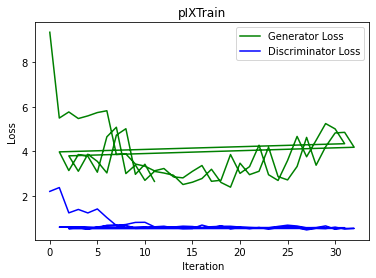

[Epoch 2/200] [Batch 10] [D loss: 0.508168, acc:  54%] [G loss: 2.937742] time: 0:01:55.467779


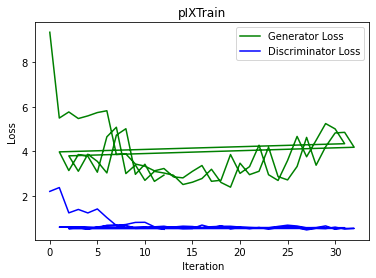

[Epoch 2/200] [Batch 11] [D loss: 0.554525, acc:  56%] [G loss: 2.862700] time: 0:01:55.948756


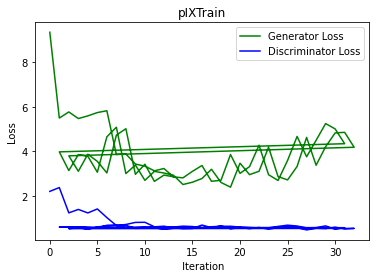

[Epoch 2/200] [Batch 12] [D loss: 0.587599, acc:  50%] [G loss: 2.937140] time: 0:01:56.429571


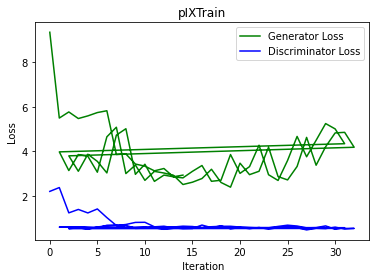

[Epoch 2/200] [Batch 13] [D loss: 0.503184, acc:  60%] [G loss: 2.763188] time: 0:01:56.914995


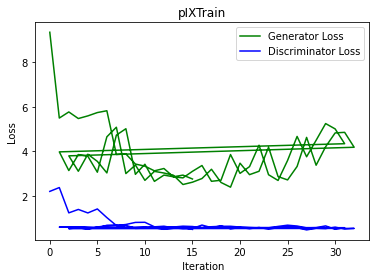

[Epoch 2/200] [Batch 14] [D loss: 0.576245, acc:  52%] [G loss: 2.531265] time: 0:01:57.393339


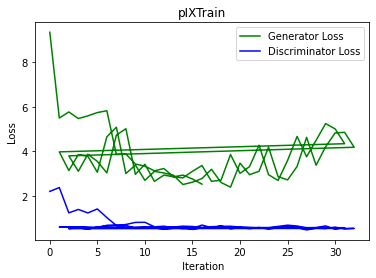

[Epoch 2/200] [Batch 15] [D loss: 0.553029, acc:  50%] [G loss: 2.680964] time: 0:01:57.872154


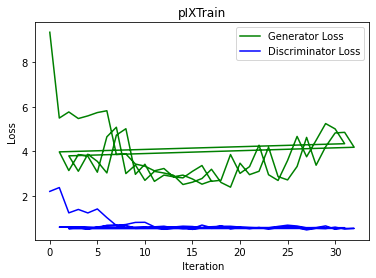

[Epoch 2/200] [Batch 16] [D loss: 0.502083, acc:  52%] [G loss: 2.907184] time: 0:01:58.357073


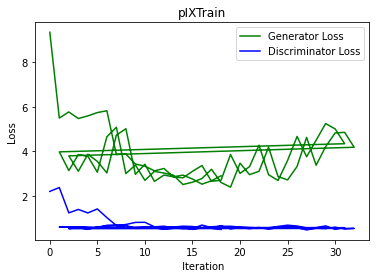

[Epoch 2/200] [Batch 17] [D loss: 0.515392, acc:  53%] [G loss: 2.561827] time: 0:01:58.843793


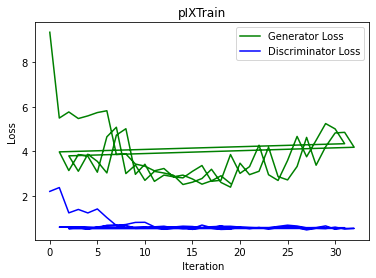

[Epoch 2/200] [Batch 18] [D loss: 0.524625, acc:  54%] [G loss: 2.297376] time: 0:01:59.321914


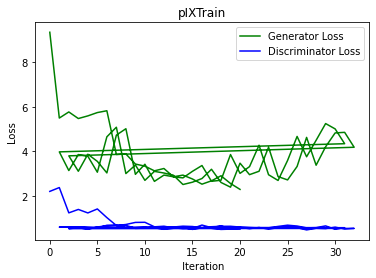

[Epoch 2/200] [Batch 19] [D loss: 0.478713, acc:  58%] [G loss: 3.621893] time: 0:01:59.801188


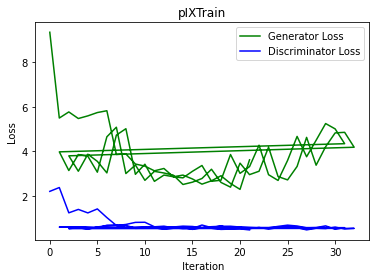

[Epoch 2/200] [Batch 20] [D loss: 0.529518, acc:  55%] [G loss: 2.939967] time: 0:02:00.283016


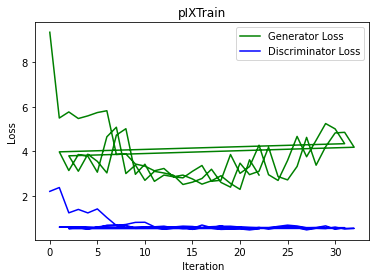

<Figure size 432x288 with 0 Axes>

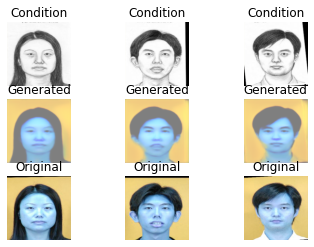

[Epoch 2/200] [Batch 21] [D loss: 0.514971, acc:  55%] [G loss: 3.273764] time: 0:02:03.088278


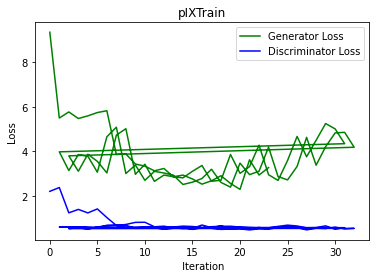

[Epoch 2/200] [Batch 22] [D loss: 0.478051, acc:  54%] [G loss: 4.125346] time: 0:02:03.565368


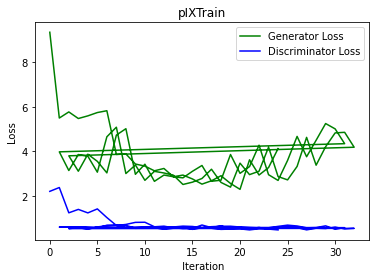

[Epoch 2/200] [Batch 23] [D loss: 0.494201, acc:  57%] [G loss: 2.736253] time: 0:02:04.042786


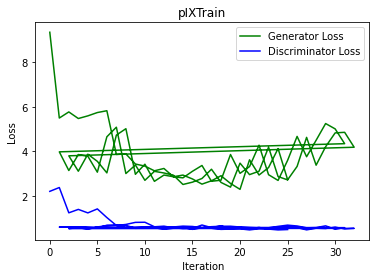

[Epoch 2/200] [Batch 24] [D loss: 0.551173, acc:  55%] [G loss: 2.570901] time: 0:02:04.525076


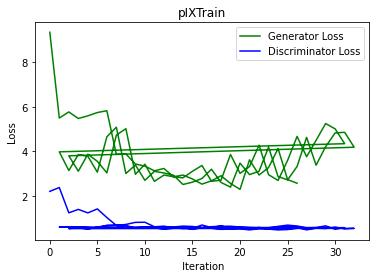

[Epoch 2/200] [Batch 25] [D loss: 0.494649, acc:  59%] [G loss: 3.184945] time: 0:02:05.009070


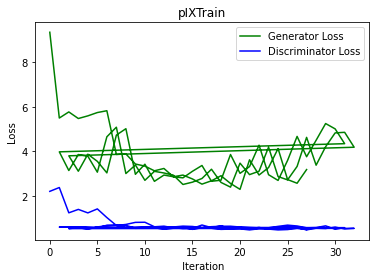

[Epoch 2/200] [Batch 26] [D loss: 0.564919, acc:  62%] [G loss: 4.706677] time: 0:02:05.489639


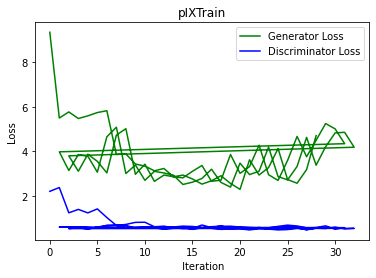

[Epoch 2/200] [Batch 27] [D loss: 0.553656, acc:  50%] [G loss: 3.386943] time: 0:02:05.966866


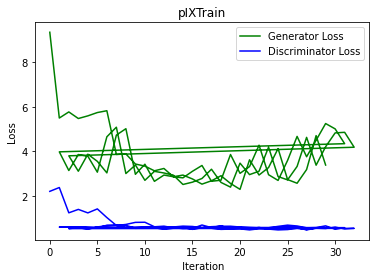

[Epoch 2/200] [Batch 28] [D loss: 0.477368, acc:  52%] [G loss: 4.090646] time: 0:02:06.447037


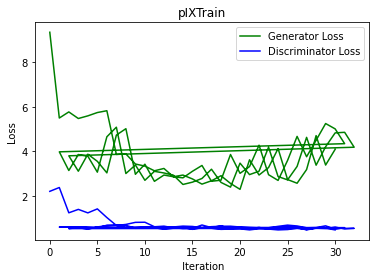

[Epoch 2/200] [Batch 29] [D loss: 0.518962, acc:  53%] [G loss: 4.608993] time: 0:02:06.927577


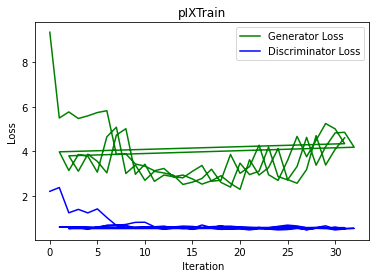

[Epoch 2/200] [Batch 30] [D loss: 0.538628, acc:  61%] [G loss: 4.433354] time: 0:02:07.413781


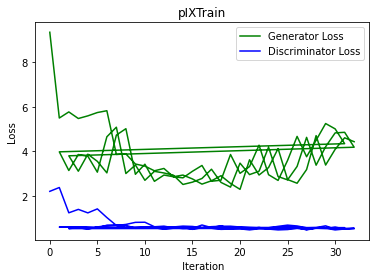

[Epoch 2/200] [Batch 31] [D loss: 0.561983, acc:  56%] [G loss: 4.317803] time: 0:02:07.900510


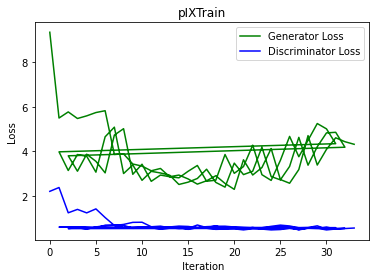

[Epoch 3/200] [Batch 0] [D loss: 0.563219, acc:  48%] [G loss: 4.069956] time: 0:02:08.392734


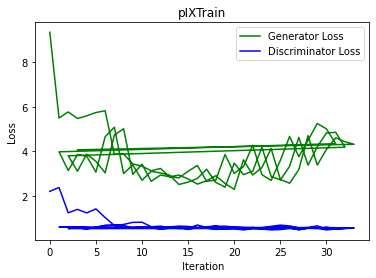

<Figure size 432x288 with 0 Axes>

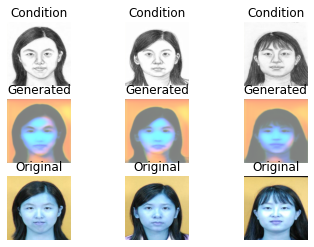

[Epoch 3/200] [Batch 1] [D loss: 0.494936, acc:  50%] [G loss: 3.242532] time: 0:02:10.740465


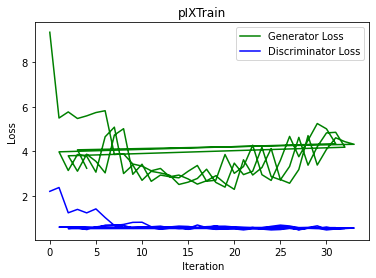

[Epoch 3/200] [Batch 2] [D loss: 0.498152, acc:  59%] [G loss: 3.788189] time: 0:02:11.239522


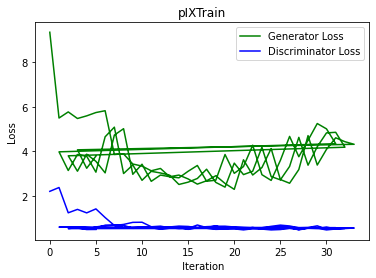

[Epoch 3/200] [Batch 3] [D loss: 0.543717, acc:  52%] [G loss: 3.723875] time: 0:02:11.722662


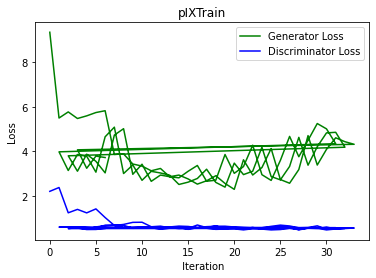

[Epoch 3/200] [Batch 4] [D loss: 0.495079, acc:  54%] [G loss: 3.038656] time: 0:02:12.208996


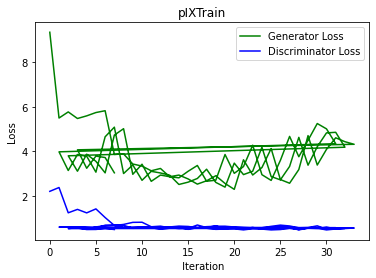

[Epoch 3/200] [Batch 5] [D loss: 0.534389, acc:  61%] [G loss: 4.647505] time: 0:02:12.704629


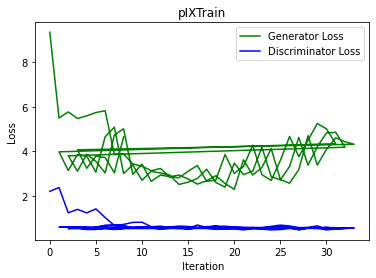

[Epoch 3/200] [Batch 6] [D loss: 0.574604, acc:  53%] [G loss: 4.897470] time: 0:02:13.186265


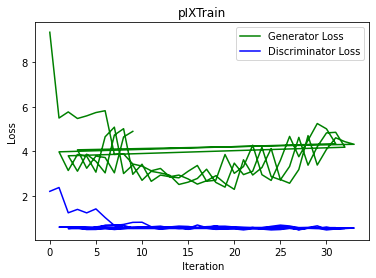

[Epoch 3/200] [Batch 7] [D loss: 0.595780, acc:  50%] [G loss: 2.711693] time: 0:02:13.664087


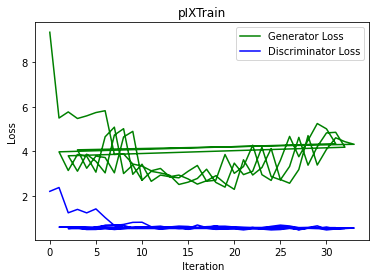

[Epoch 3/200] [Batch 8] [D loss: 0.543003, acc:  48%] [G loss: 3.262209] time: 0:02:14.148995


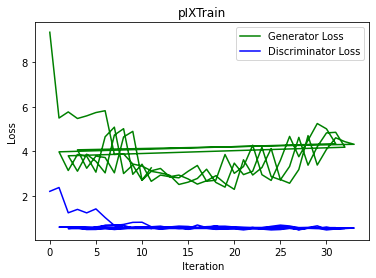

[Epoch 3/200] [Batch 9] [D loss: 0.515321, acc:  52%] [G loss: 2.628575] time: 0:02:14.630737


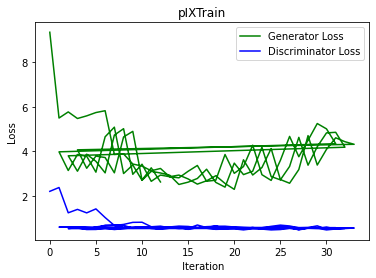

[Epoch 3/200] [Batch 10] [D loss: 0.552185, acc:  61%] [G loss: 3.158838] time: 0:02:15.113122


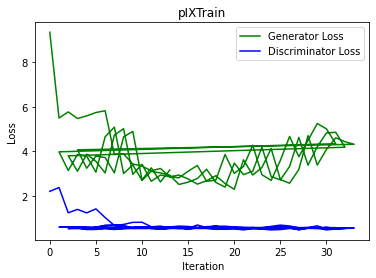

[Epoch 3/200] [Batch 11] [D loss: 0.514919, acc:  49%] [G loss: 2.718738] time: 0:02:15.744199


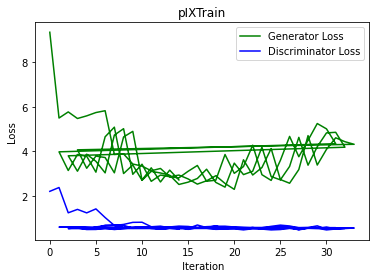

[Epoch 3/200] [Batch 12] [D loss: 0.517519, acc:  51%] [G loss: 2.848891] time: 0:02:16.224113


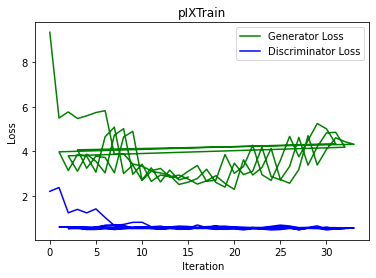

[Epoch 3/200] [Batch 13] [D loss: 0.534199, acc:  55%] [G loss: 2.481712] time: 0:02:16.701478


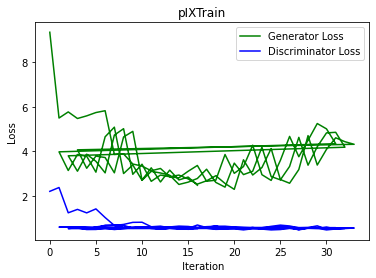

[Epoch 3/200] [Batch 14] [D loss: 0.523006, acc:  59%] [G loss: 2.618011] time: 0:02:17.187955


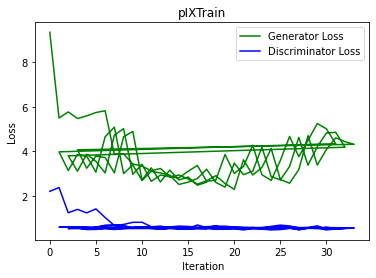

[Epoch 3/200] [Batch 15] [D loss: 0.512028, acc:  53%] [G loss: 2.667370] time: 0:02:17.666940


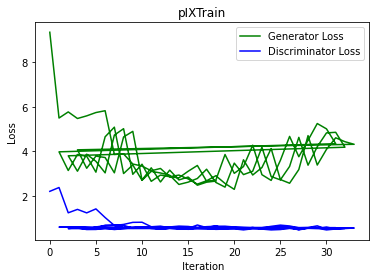

[Epoch 3/200] [Batch 16] [D loss: 0.511916, acc:  52%] [G loss: 2.961105] time: 0:02:18.151602


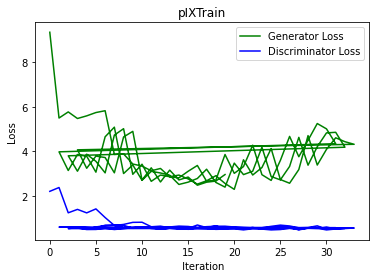

[Epoch 3/200] [Batch 17] [D loss: 0.601266, acc:  45%] [G loss: 2.445818] time: 0:02:18.641897


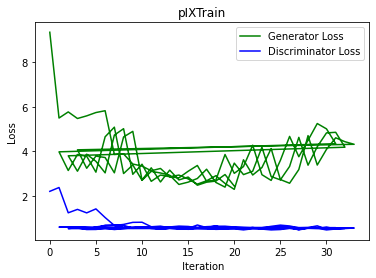

[Epoch 3/200] [Batch 18] [D loss: 0.532640, acc:  47%] [G loss: 2.376306] time: 0:02:19.123098


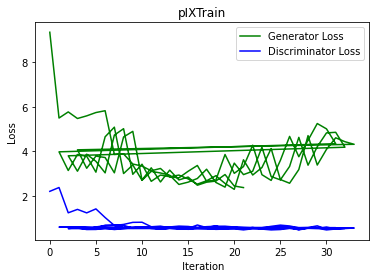

[Epoch 3/200] [Batch 19] [D loss: 0.493303, acc:  58%] [G loss: 3.596725] time: 0:02:19.605567


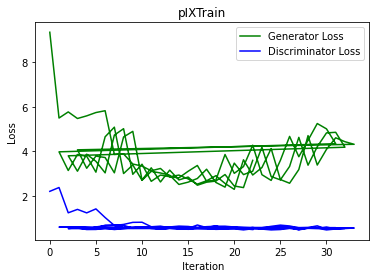

[Epoch 3/200] [Batch 20] [D loss: 0.498063, acc:  49%] [G loss: 2.843955] time: 0:02:20.086796


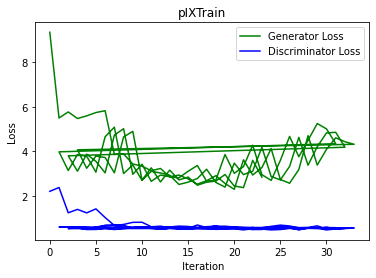

<Figure size 432x288 with 0 Axes>

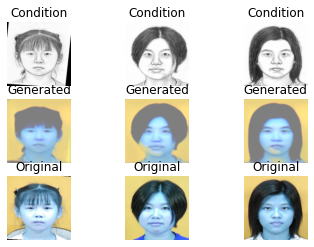

[Epoch 3/200] [Batch 21] [D loss: 0.447759, acc:  59%] [G loss: 3.054718] time: 0:02:22.928147


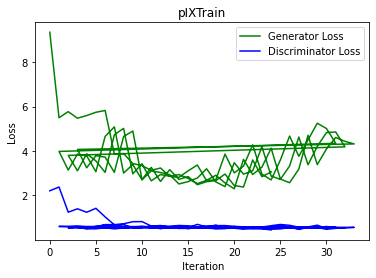

[Epoch 3/200] [Batch 22] [D loss: 0.504108, acc:  61%] [G loss: 4.043884] time: 0:02:23.418716


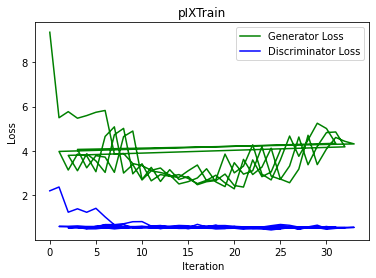

[Epoch 3/200] [Batch 23] [D loss: 0.499810, acc:  58%] [G loss: 2.727728] time: 0:02:23.911594


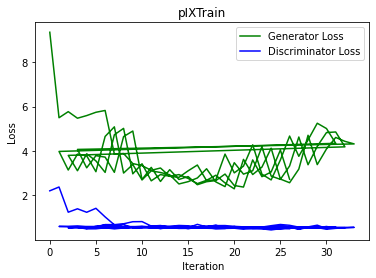

[Epoch 3/200] [Batch 24] [D loss: 0.596617, acc:  58%] [G loss: 2.559942] time: 0:02:24.404807


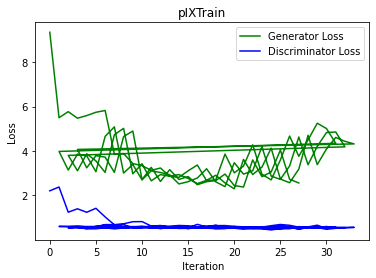

[Epoch 3/200] [Batch 25] [D loss: 0.457529, acc:  52%] [G loss: 3.073938] time: 0:02:24.884160


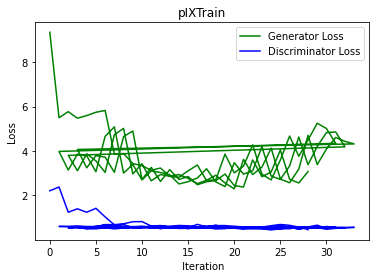

[Epoch 3/200] [Batch 26] [D loss: 0.451365, acc:  62%] [G loss: 4.505173] time: 0:02:25.373021


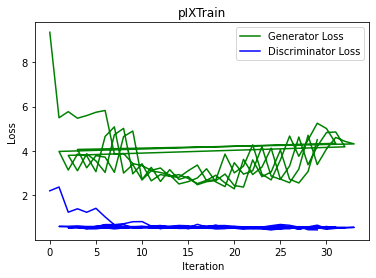

[Epoch 3/200] [Batch 27] [D loss: 0.486476, acc:  53%] [G loss: 3.419374] time: 0:02:25.852110


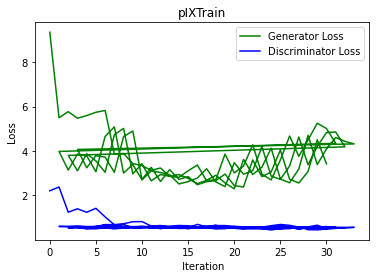

[Epoch 3/200] [Batch 28] [D loss: 0.513328, acc:  52%] [G loss: 3.960329] time: 0:02:26.336238


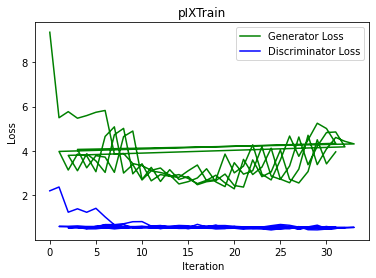

[Epoch 3/200] [Batch 29] [D loss: 0.471951, acc:  59%] [G loss: 4.661945] time: 0:02:26.815116


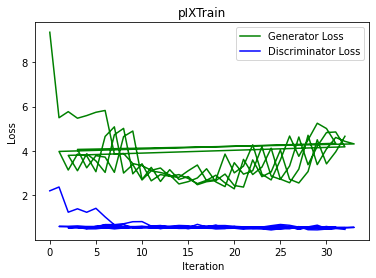

[Epoch 3/200] [Batch 30] [D loss: 0.541457, acc:  57%] [G loss: 4.344360] time: 0:02:27.295242


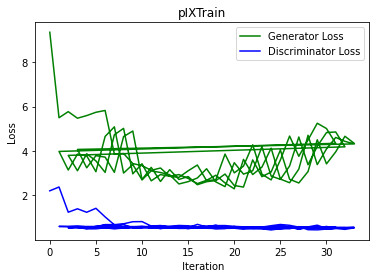

[Epoch 3/200] [Batch 31] [D loss: 0.466053, acc:  57%] [G loss: 4.227403] time: 0:02:27.774231


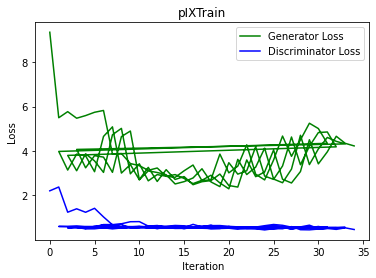

[Epoch 4/200] [Batch 0] [D loss: 0.477130, acc:  62%] [G loss: 4.196394] time: 0:02:28.260378


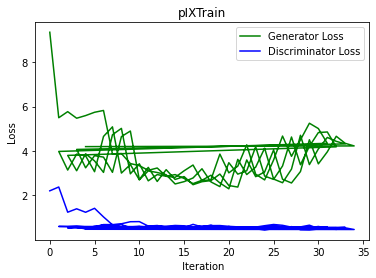

<Figure size 432x288 with 0 Axes>

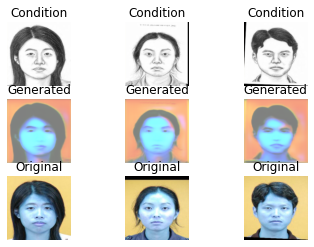

[Epoch 4/200] [Batch 1] [D loss: 0.486033, acc:  62%] [G loss: 3.546189] time: 0:02:30.638369


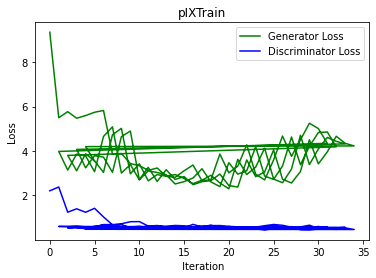

[Epoch 4/200] [Batch 2] [D loss: 0.556233, acc:  50%] [G loss: 3.837947] time: 0:02:31.122129


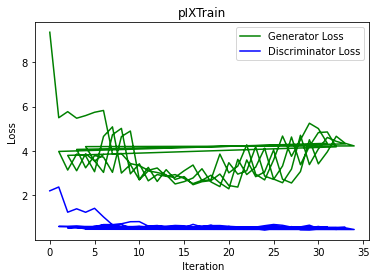

[Epoch 4/200] [Batch 3] [D loss: 0.488135, acc:  55%] [G loss: 3.500600] time: 0:02:31.611407


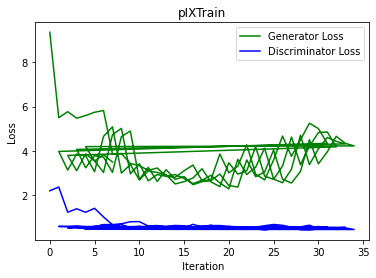

[Epoch 4/200] [Batch 4] [D loss: 0.519109, acc:  56%] [G loss: 3.033761] time: 0:02:32.093940


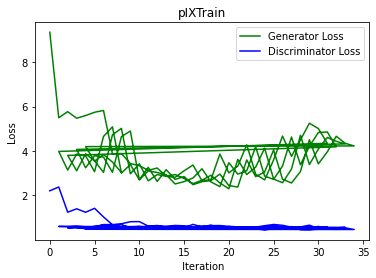

[Epoch 4/200] [Batch 5] [D loss: 0.521625, acc:  52%] [G loss: 4.702128] time: 0:02:32.575097


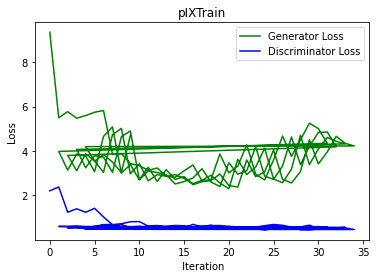

[Epoch 4/200] [Batch 6] [D loss: 0.560748, acc:  57%] [G loss: 4.871853] time: 0:02:33.060195


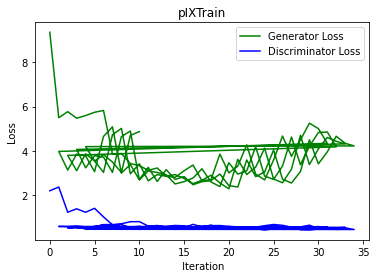

[Epoch 4/200] [Batch 7] [D loss: 0.580812, acc:  51%] [G loss: 2.680115] time: 0:02:33.543564


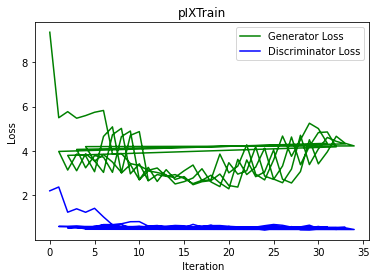

[Epoch 4/200] [Batch 8] [D loss: 0.520491, acc:  55%] [G loss: 3.038606] time: 0:02:34.021883


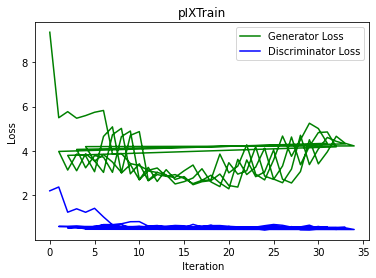

[Epoch 4/200] [Batch 9] [D loss: 0.528338, acc:  49%] [G loss: 2.651724] time: 0:02:34.520979


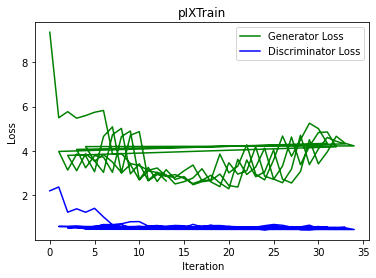

[Epoch 4/200] [Batch 10] [D loss: 0.532949, acc:  57%] [G loss: 2.974346] time: 0:02:34.999726


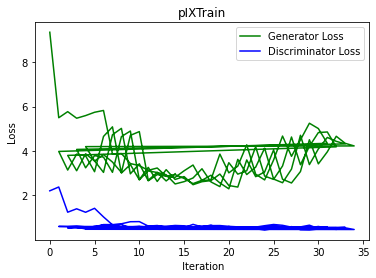

[Epoch 4/200] [Batch 11] [D loss: 0.507293, acc:  56%] [G loss: 2.915274] time: 0:02:35.492214


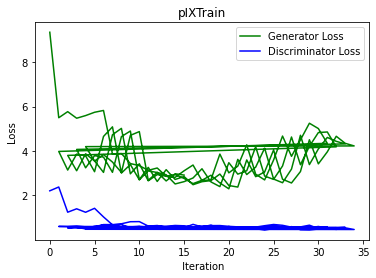

[Epoch 4/200] [Batch 12] [D loss: 0.489664, acc:  55%] [G loss: 2.848627] time: 0:02:35.977322


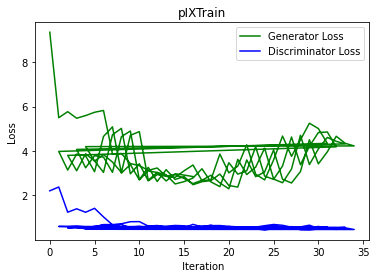

[Epoch 4/200] [Batch 13] [D loss: 0.555016, acc:  53%] [G loss: 2.507054] time: 0:02:36.470661


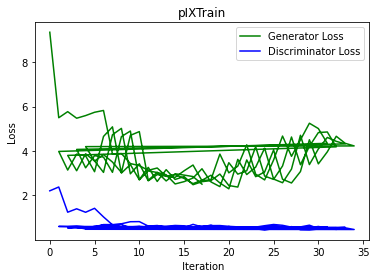

[Epoch 4/200] [Batch 14] [D loss: 0.501408, acc:  60%] [G loss: 2.517723] time: 0:02:36.952560


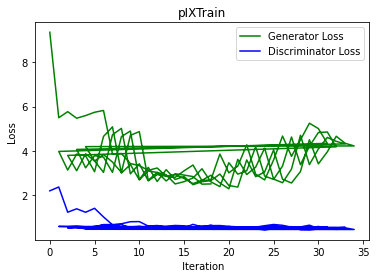

[Epoch 4/200] [Batch 15] [D loss: 0.483851, acc:  55%] [G loss: 2.661201] time: 0:02:37.435392


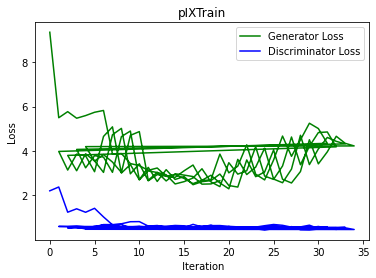

[Epoch 4/200] [Batch 16] [D loss: 0.469757, acc:  61%] [G loss: 2.985557] time: 0:02:37.926077


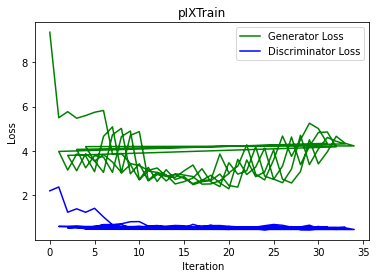

[Epoch 4/200] [Batch 17] [D loss: 0.523943, acc:  49%] [G loss: 2.397119] time: 0:02:38.411847


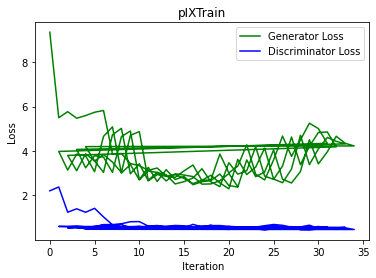

[Epoch 4/200] [Batch 18] [D loss: 0.506651, acc:  54%] [G loss: 2.287970] time: 0:02:38.894529


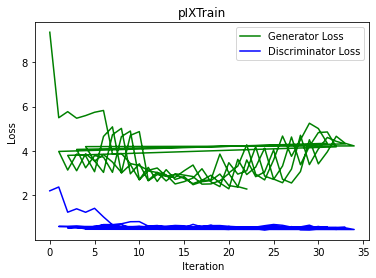

[Epoch 4/200] [Batch 19] [D loss: 0.506537, acc:  58%] [G loss: 3.327351] time: 0:02:39.379747


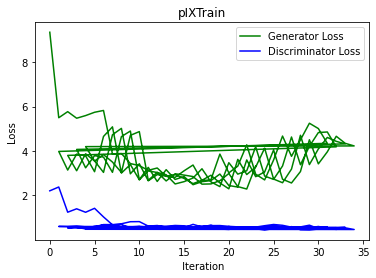

[Epoch 4/200] [Batch 20] [D loss: 0.554921, acc:  58%] [G loss: 2.915195] time: 0:02:39.860557


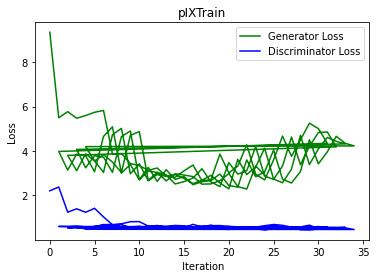

<Figure size 432x288 with 0 Axes>

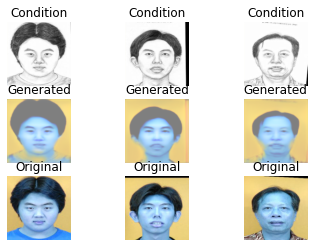

[Epoch 4/200] [Batch 21] [D loss: 0.569669, acc:  51%] [G loss: 3.055367] time: 0:02:42.284536


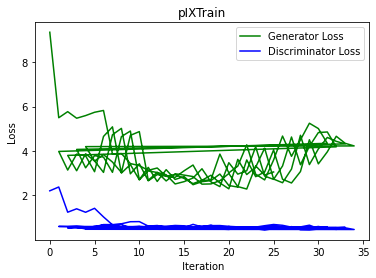

[Epoch 4/200] [Batch 22] [D loss: 0.568770, acc:  64%] [G loss: 4.172084] time: 0:02:42.772314


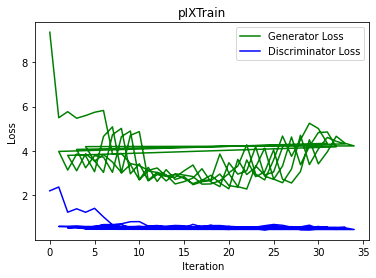

[Epoch 4/200] [Batch 23] [D loss: 0.536279, acc:  48%] [G loss: 2.645725] time: 0:02:43.260693


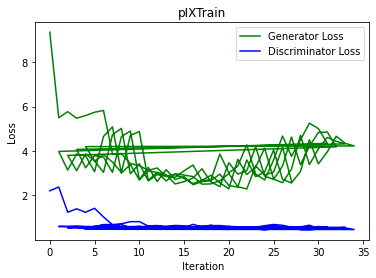

[Epoch 4/200] [Batch 24] [D loss: 0.505106, acc:  65%] [G loss: 2.537516] time: 0:02:43.742379


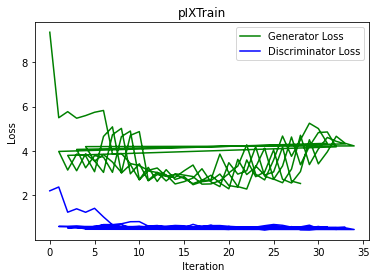

[Epoch 4/200] [Batch 25] [D loss: 0.554441, acc:  46%] [G loss: 3.050991] time: 0:02:44.223745


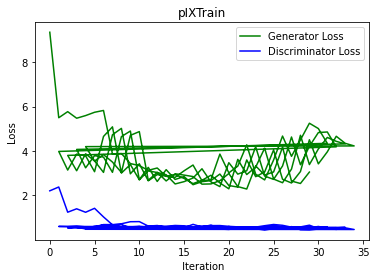

[Epoch 4/200] [Batch 26] [D loss: 0.508307, acc:  62%] [G loss: 4.681222] time: 0:02:44.705416


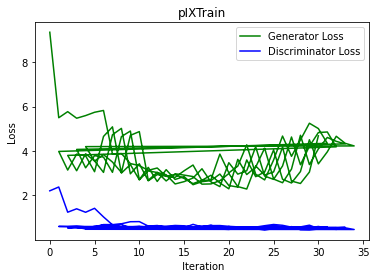

[Epoch 4/200] [Batch 27] [D loss: 0.452176, acc:  61%] [G loss: 3.316354] time: 0:02:45.186370


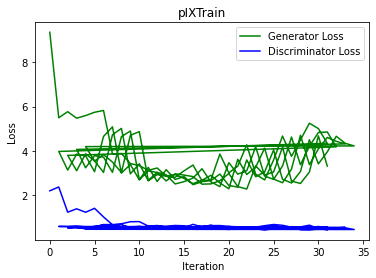

[Epoch 4/200] [Batch 28] [D loss: 0.431979, acc:  61%] [G loss: 3.988817] time: 0:02:45.675256


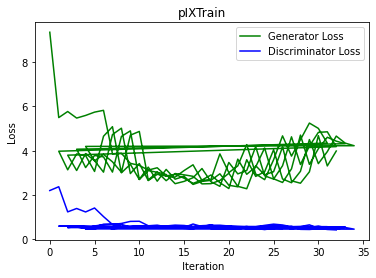

[Epoch 4/200] [Batch 29] [D loss: 0.503007, acc:  56%] [G loss: 4.656150] time: 0:02:46.156833


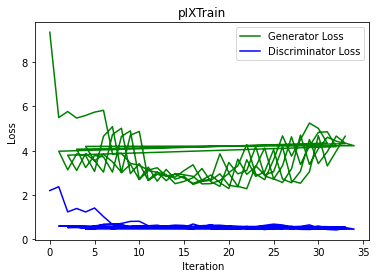

[Epoch 4/200] [Batch 30] [D loss: 0.454713, acc:  57%] [G loss: 4.393904] time: 0:02:46.665883


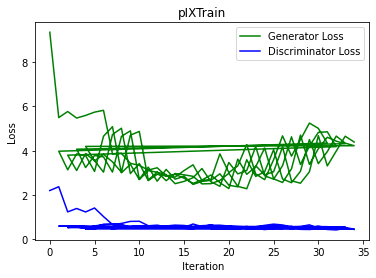

[Epoch 4/200] [Batch 31] [D loss: 0.467640, acc:  51%] [G loss: 4.050335] time: 0:02:47.151038


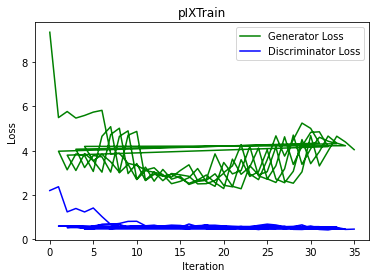

[Epoch 5/200] [Batch 0] [D loss: 0.477512, acc:  59%] [G loss: 4.000163] time: 0:02:47.643477


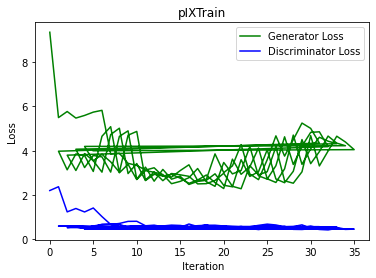

<Figure size 432x288 with 0 Axes>

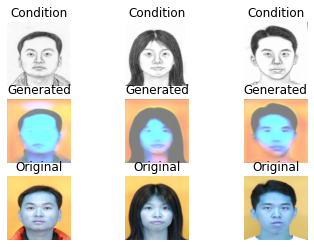

[Epoch 5/200] [Batch 1] [D loss: 0.487928, acc:  61%] [G loss: 3.179027] time: 0:02:50.379346


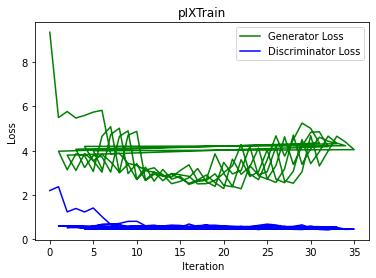

[Epoch 5/200] [Batch 2] [D loss: 0.487739, acc:  61%] [G loss: 3.746499] time: 0:02:50.869752


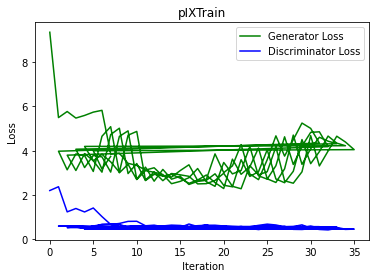

[Epoch 5/200] [Batch 3] [D loss: 0.448198, acc:  57%] [G loss: 3.546866] time: 0:02:51.357010


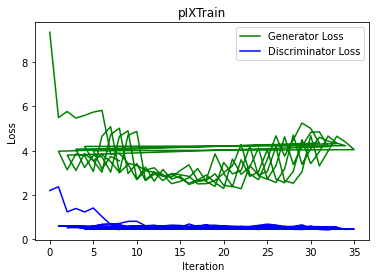

[Epoch 5/200] [Batch 4] [D loss: 0.520626, acc:  65%] [G loss: 3.211320] time: 0:02:51.844265


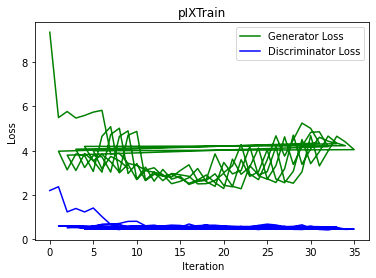

[Epoch 5/200] [Batch 5] [D loss: 0.528280, acc:  52%] [G loss: 4.746668] time: 0:02:52.327692


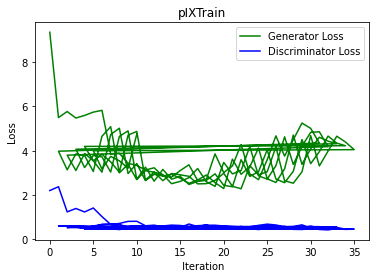

[Epoch 5/200] [Batch 6] [D loss: 0.452081, acc:  58%] [G loss: 4.832129] time: 0:02:52.819026


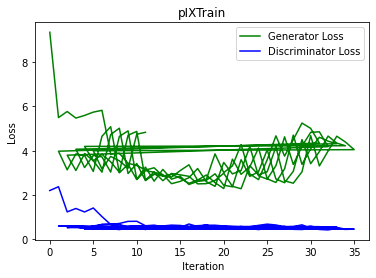

[Epoch 5/200] [Batch 7] [D loss: 0.452039, acc:  54%] [G loss: 2.734187] time: 0:02:53.446637


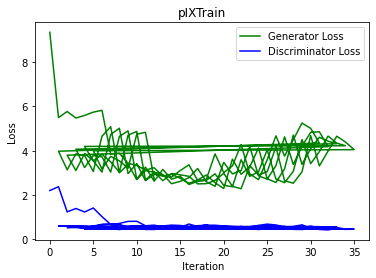

[Epoch 5/200] [Batch 8] [D loss: 0.501329, acc:  51%] [G loss: 3.186197] time: 0:02:53.929371


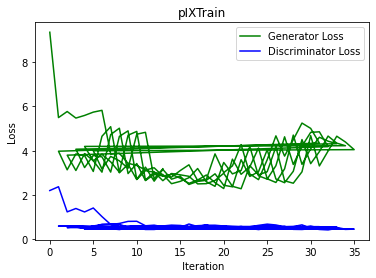

[Epoch 5/200] [Batch 9] [D loss: 0.502847, acc:  56%] [G loss: 2.478796] time: 0:02:54.413641


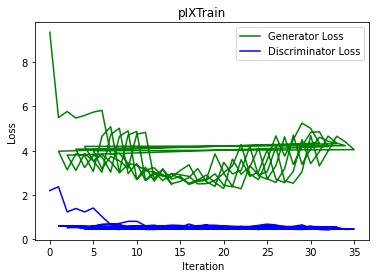

[Epoch 5/200] [Batch 10] [D loss: 0.562881, acc:  59%] [G loss: 2.908806] time: 0:02:54.897852


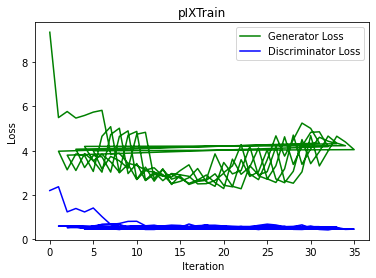

[Epoch 5/200] [Batch 11] [D loss: 0.564222, acc:  56%] [G loss: 2.772088] time: 0:02:55.386026


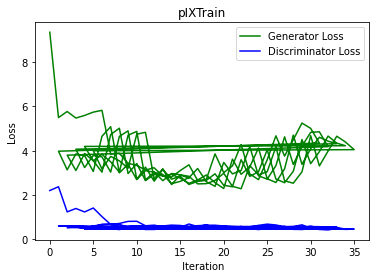

[Epoch 5/200] [Batch 12] [D loss: 0.444328, acc:  64%] [G loss: 2.981922] time: 0:02:55.876987


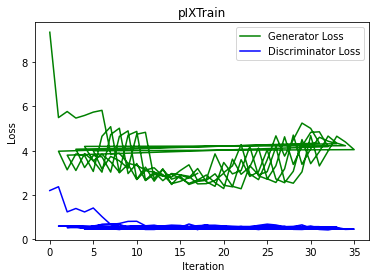

[Epoch 5/200] [Batch 13] [D loss: 0.519280, acc:  56%] [G loss: 2.559457] time: 0:02:56.364263


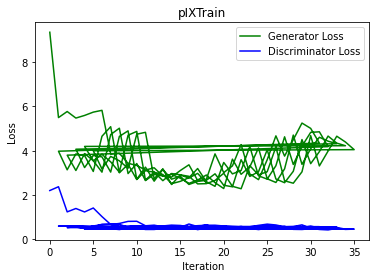

[Epoch 5/200] [Batch 14] [D loss: 0.481381, acc:  55%] [G loss: 2.481668] time: 0:02:56.854969


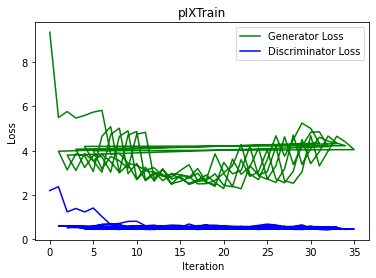

[Epoch 5/200] [Batch 15] [D loss: 0.473603, acc:  55%] [G loss: 2.610373] time: 0:02:57.345023


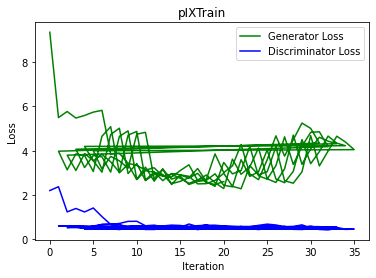

[Epoch 5/200] [Batch 16] [D loss: 0.454044, acc:  59%] [G loss: 2.912744] time: 0:02:57.839594


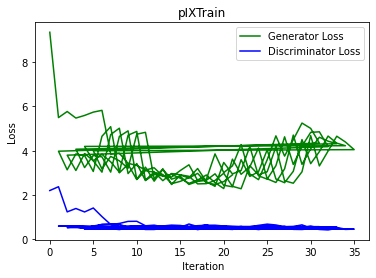

[Epoch 5/200] [Batch 17] [D loss: 0.496781, acc:  62%] [G loss: 2.370978] time: 0:02:58.326952


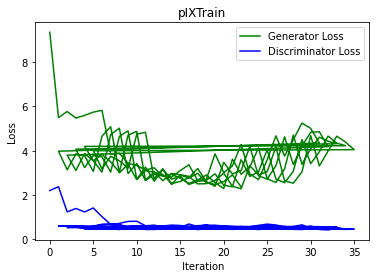

[Epoch 5/200] [Batch 18] [D loss: 0.497028, acc:  56%] [G loss: 2.274289] time: 0:02:58.811457


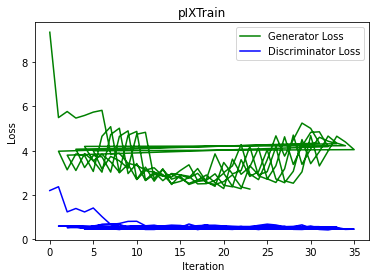

[Epoch 5/200] [Batch 19] [D loss: 0.484273, acc:  70%] [G loss: 3.668391] time: 0:02:59.295629


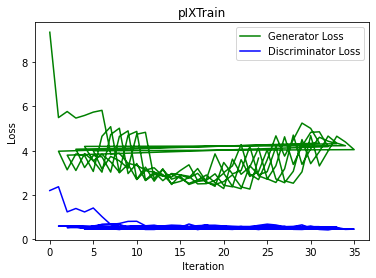

[Epoch 5/200] [Batch 20] [D loss: 0.533354, acc:  51%] [G loss: 2.838875] time: 0:02:59.788756


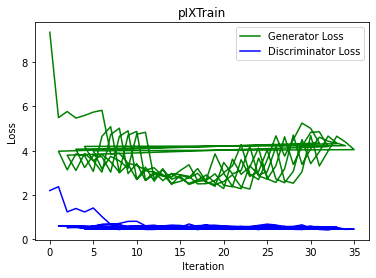

<Figure size 432x288 with 0 Axes>

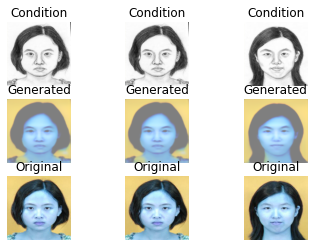

[Epoch 5/200] [Batch 21] [D loss: 0.421415, acc:  64%] [G loss: 3.213836] time: 0:03:01.347281


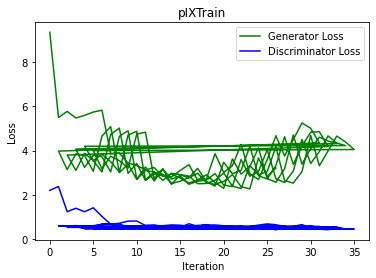

[Epoch 5/200] [Batch 22] [D loss: 0.471066, acc:  63%] [G loss: 4.024346] time: 0:03:01.837083


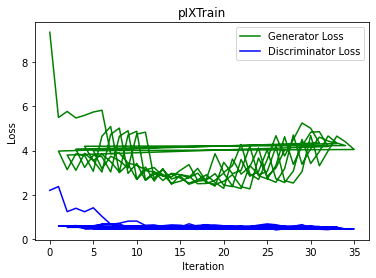

[Epoch 5/200] [Batch 23] [D loss: 0.443492, acc:  54%] [G loss: 2.666917] time: 0:03:02.330573


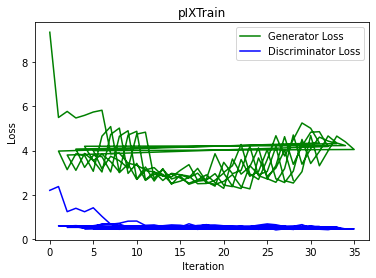

[Epoch 5/200] [Batch 24] [D loss: 0.455772, acc:  61%] [G loss: 2.586911] time: 0:03:02.820908


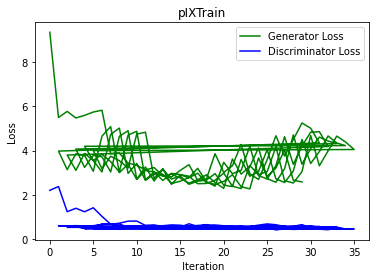

[Epoch 5/200] [Batch 25] [D loss: 0.509418, acc:  60%] [G loss: 3.212085] time: 0:03:03.318982


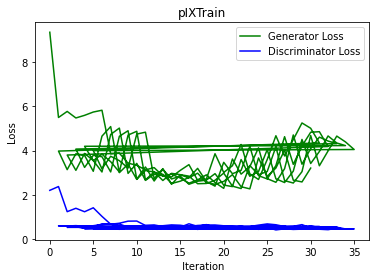

[Epoch 5/200] [Batch 26] [D loss: 0.496325, acc:  58%] [G loss: 4.514757] time: 0:03:03.813329


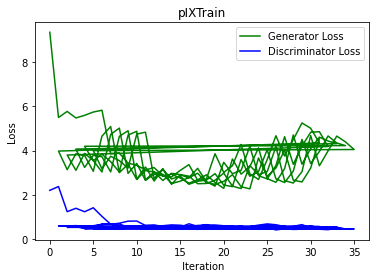

[Epoch 5/200] [Batch 27] [D loss: 0.454906, acc:  67%] [G loss: 3.623824] time: 0:03:04.303182


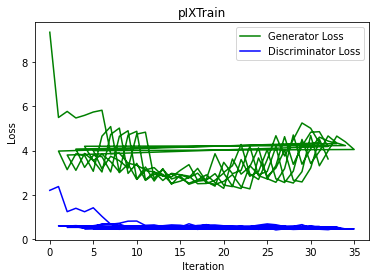

[Epoch 5/200] [Batch 28] [D loss: 0.527679, acc:  54%] [G loss: 4.018961] time: 0:03:04.948224


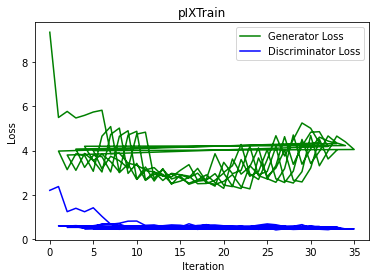

[Epoch 5/200] [Batch 29] [D loss: 0.449533, acc:  59%] [G loss: 4.718272] time: 0:03:05.432223


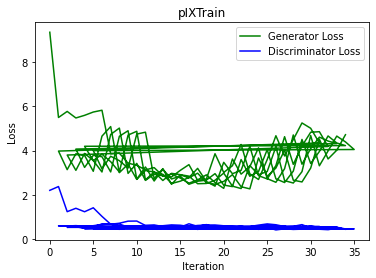

[Epoch 5/200] [Batch 30] [D loss: 0.446071, acc:  62%] [G loss: 4.475973] time: 0:03:05.916564


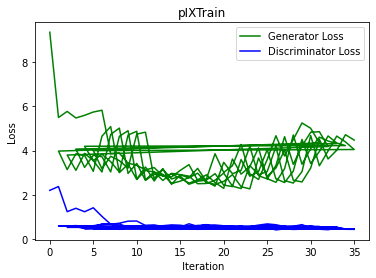

[Epoch 5/200] [Batch 31] [D loss: 0.449509, acc:  65%] [G loss: 4.376553] time: 0:03:06.406828


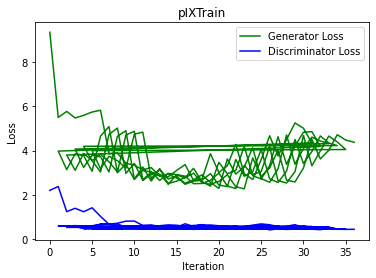

[Epoch 6/200] [Batch 0] [D loss: 0.503200, acc:  51%] [G loss: 4.244744] time: 0:03:06.907243


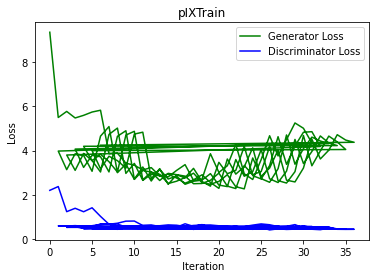

<Figure size 432x288 with 0 Axes>

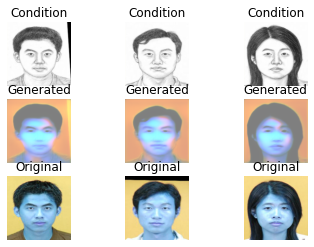

[Epoch 6/200] [Batch 1] [D loss: 0.431560, acc:  57%] [G loss: 3.277965] time: 0:03:09.014151


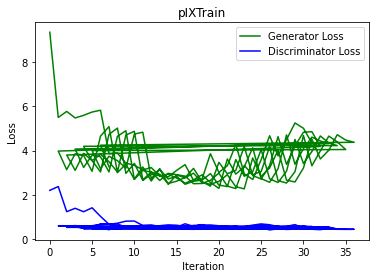

[Epoch 6/200] [Batch 2] [D loss: 0.480456, acc:  68%] [G loss: 3.882070] time: 0:03:09.504603


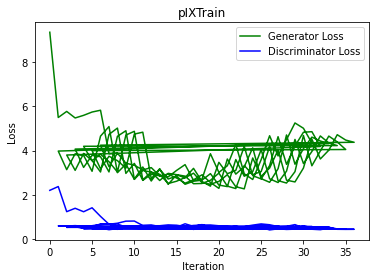

[Epoch 6/200] [Batch 3] [D loss: 0.496152, acc:  52%] [G loss: 3.452074] time: 0:03:09.988504


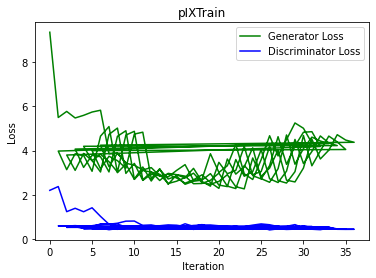

[Epoch 6/200] [Batch 4] [D loss: 0.514445, acc:  66%] [G loss: 2.887283] time: 0:03:10.489337


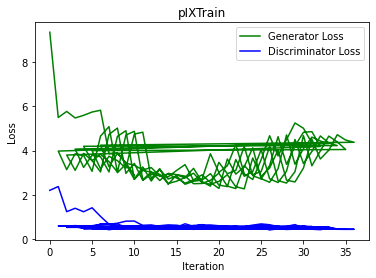

[Epoch 6/200] [Batch 5] [D loss: 0.517918, acc:  68%] [G loss: 4.622546] time: 0:03:10.976612


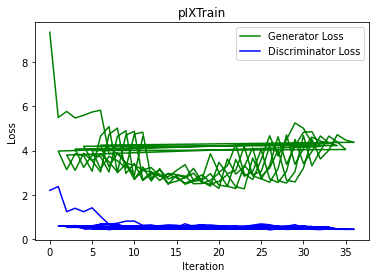

[Epoch 6/200] [Batch 6] [D loss: 0.440041, acc:  63%] [G loss: 4.901587] time: 0:03:11.476987


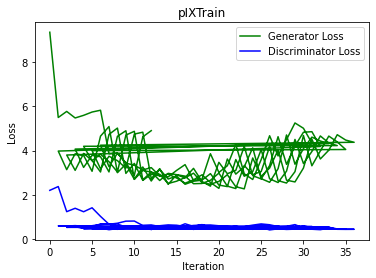

[Epoch 6/200] [Batch 7] [D loss: 0.435657, acc:  62%] [G loss: 2.680613] time: 0:03:11.960416


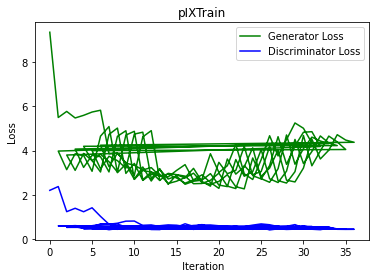

[Epoch 6/200] [Batch 8] [D loss: 0.467617, acc:  53%] [G loss: 3.056210] time: 0:03:12.448587


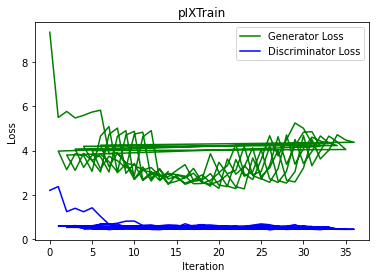

[Epoch 6/200] [Batch 9] [D loss: 0.515271, acc:  58%] [G loss: 2.724506] time: 0:03:12.940808


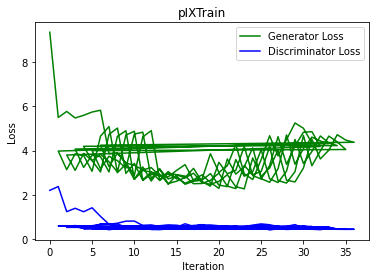

[Epoch 6/200] [Batch 10] [D loss: 0.491872, acc:  56%] [G loss: 2.958359] time: 0:03:13.431498


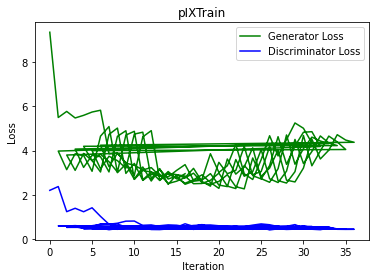

[Epoch 6/200] [Batch 11] [D loss: 0.460962, acc:  58%] [G loss: 2.702694] time: 0:03:13.929415


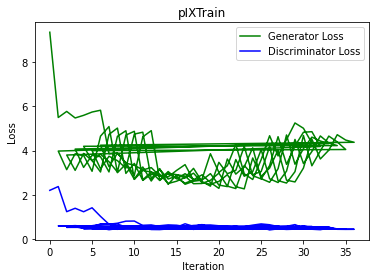

[Epoch 6/200] [Batch 12] [D loss: 0.461955, acc:  56%] [G loss: 2.823786] time: 0:03:14.415186


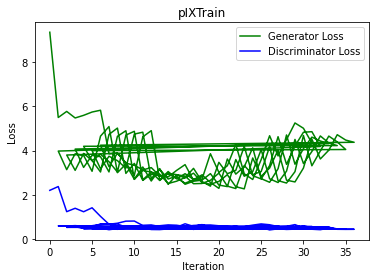

[Epoch 6/200] [Batch 13] [D loss: 0.473635, acc:  57%] [G loss: 2.513551] time: 0:03:14.909134


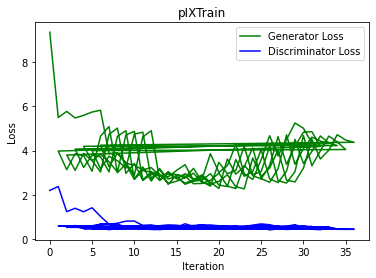

[Epoch 6/200] [Batch 14] [D loss: 0.467103, acc:  59%] [G loss: 2.502440] time: 0:03:15.399894


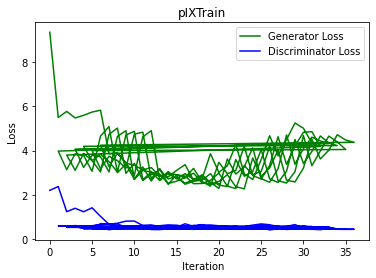

[Epoch 6/200] [Batch 15] [D loss: 0.452676, acc:  58%] [G loss: 2.554997] time: 0:03:15.896463


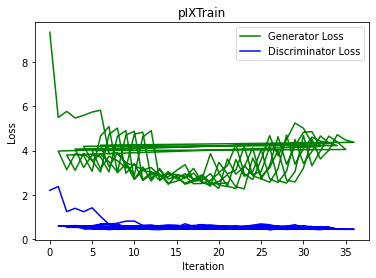

[Epoch 6/200] [Batch 16] [D loss: 0.405840, acc:  57%] [G loss: 2.902875] time: 0:03:16.382308


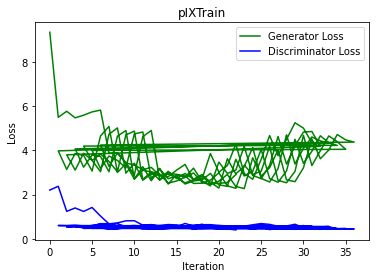

[Epoch 6/200] [Batch 17] [D loss: 0.478049, acc:  64%] [G loss: 2.503453] time: 0:03:17.012374


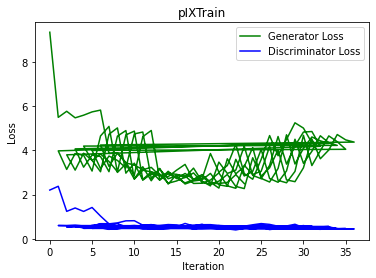

[Epoch 6/200] [Batch 18] [D loss: 0.491444, acc:  55%] [G loss: 2.346432] time: 0:03:17.497752


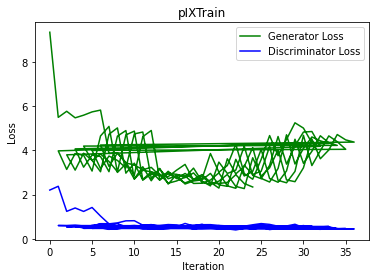

[Epoch 6/200] [Batch 19] [D loss: 0.458416, acc:  58%] [G loss: 3.408475] time: 0:03:17.999588


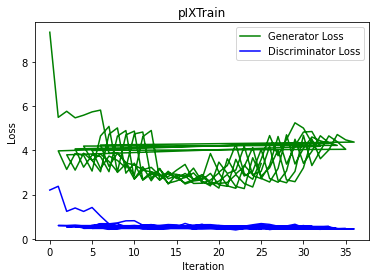

[Epoch 6/200] [Batch 20] [D loss: 0.452288, acc:  57%] [G loss: 2.813935] time: 0:03:18.493304


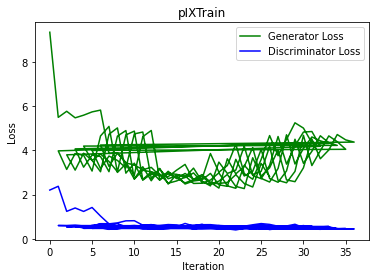

<Figure size 432x288 with 0 Axes>

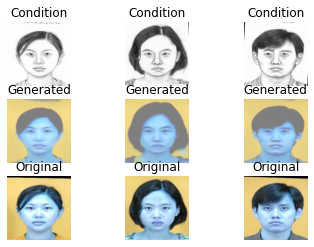

[Epoch 6/200] [Batch 21] [D loss: 0.431449, acc:  57%] [G loss: 3.174867] time: 0:03:20.828354


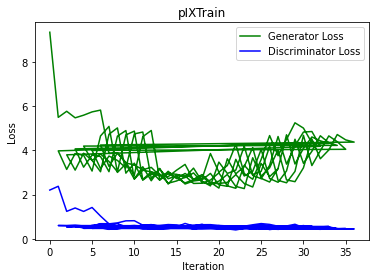

[Epoch 6/200] [Batch 22] [D loss: 0.440412, acc:  63%] [G loss: 3.974671] time: 0:03:21.317261


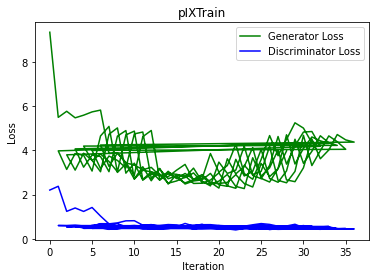

[Epoch 6/200] [Batch 23] [D loss: 0.477041, acc:  58%] [G loss: 2.601201] time: 0:03:21.807214


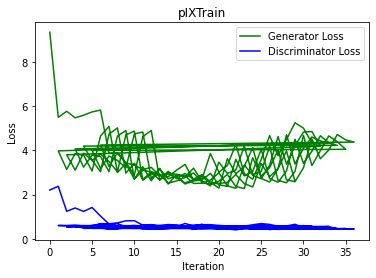

[Epoch 6/200] [Batch 24] [D loss: 0.445808, acc:  64%] [G loss: 2.436014] time: 0:03:22.294077


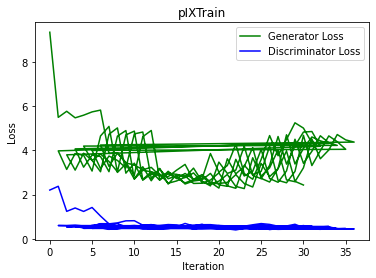

[Epoch 6/200] [Batch 25] [D loss: 0.507148, acc:  56%] [G loss: 3.048442] time: 0:03:22.794324


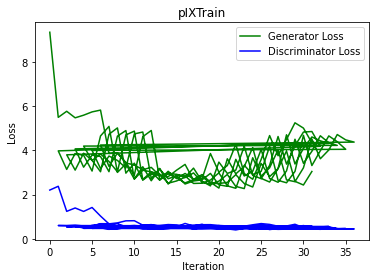

[Epoch 6/200] [Batch 26] [D loss: 0.514156, acc:  60%] [G loss: 4.541660] time: 0:03:23.278870


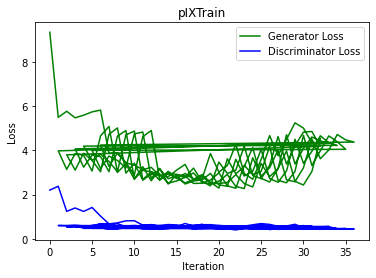

[Epoch 6/200] [Batch 27] [D loss: 0.470707, acc:  57%] [G loss: 3.433767] time: 0:03:23.780712


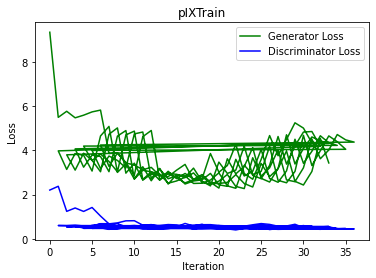

[Epoch 6/200] [Batch 28] [D loss: 0.441927, acc:  58%] [G loss: 3.955097] time: 0:03:24.281603


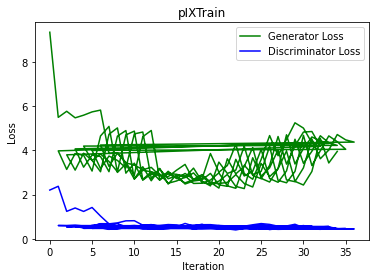

[Epoch 6/200] [Batch 29] [D loss: 0.486428, acc:  54%] [G loss: 4.696842] time: 0:03:24.771233


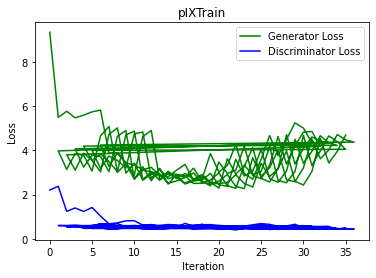

[Epoch 6/200] [Batch 30] [D loss: 0.446844, acc:  60%] [G loss: 4.495350] time: 0:03:25.259477


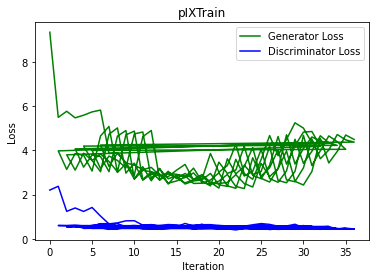

[Epoch 6/200] [Batch 31] [D loss: 0.461115, acc:  65%] [G loss: 4.240763] time: 0:03:25.759382


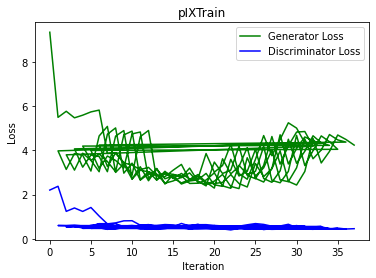

[Epoch 7/200] [Batch 0] [D loss: 0.445305, acc:  59%] [G loss: 4.164524] time: 0:03:26.246248


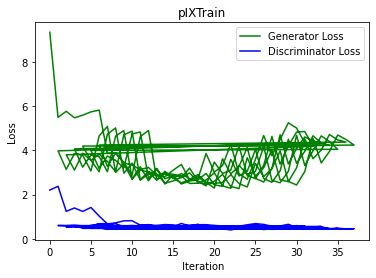

<Figure size 432x288 with 0 Axes>

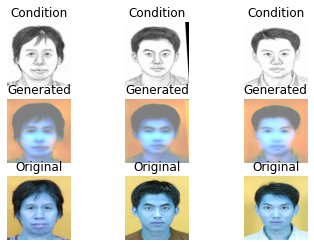

[Epoch 7/200] [Batch 1] [D loss: 0.505005, acc:  61%] [G loss: 3.389236] time: 0:03:28.541050


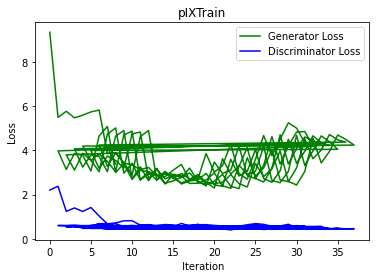

[Epoch 7/200] [Batch 2] [D loss: 0.474936, acc:  68%] [G loss: 3.711864] time: 0:03:29.031226


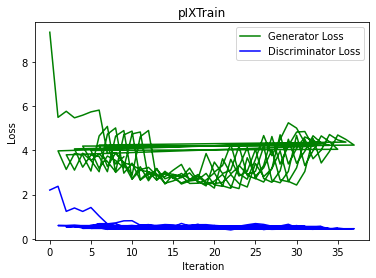

[Epoch 7/200] [Batch 3] [D loss: 0.435987, acc:  62%] [G loss: 3.483011] time: 0:03:29.526454


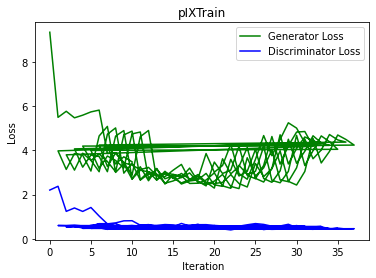

[Epoch 7/200] [Batch 4] [D loss: 0.490595, acc:  70%] [G loss: 3.126815] time: 0:03:30.016296


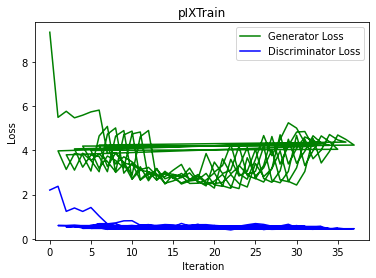

[Epoch 7/200] [Batch 5] [D loss: 0.453345, acc:  58%] [G loss: 4.636670] time: 0:03:30.499091


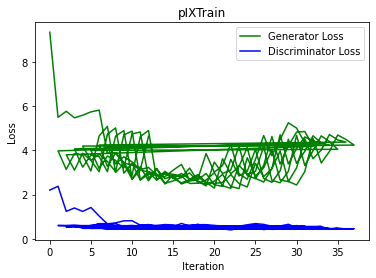

[Epoch 7/200] [Batch 6] [D loss: 0.394804, acc:  61%] [G loss: 4.754460] time: 0:03:30.988940


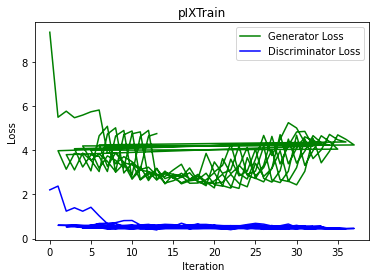

[Epoch 7/200] [Batch 7] [D loss: 0.455192, acc:  62%] [G loss: 2.652435] time: 0:03:31.479702


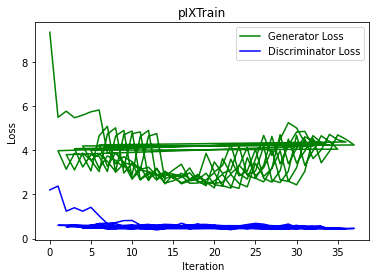

[Epoch 7/200] [Batch 8] [D loss: 0.478499, acc:  57%] [G loss: 3.052636] time: 0:03:31.967244


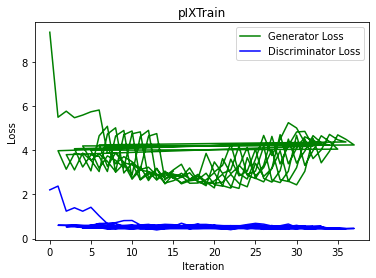

[Epoch 7/200] [Batch 9] [D loss: 0.522518, acc:  57%] [G loss: 2.564607] time: 0:03:32.460001


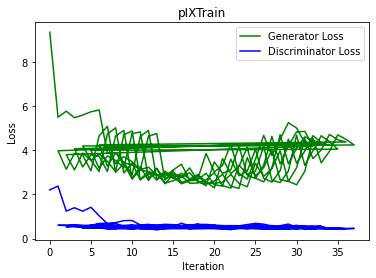

[Epoch 7/200] [Batch 10] [D loss: 0.480308, acc:  58%] [G loss: 2.904489] time: 0:03:32.955555


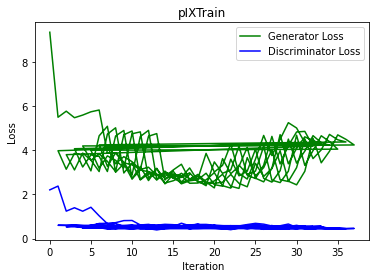

[Epoch 7/200] [Batch 11] [D loss: 0.453717, acc:  59%] [G loss: 2.708037] time: 0:03:33.440306


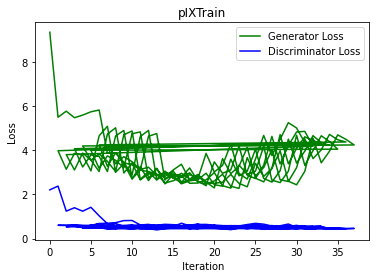

[Epoch 7/200] [Batch 12] [D loss: 0.426564, acc:  62%] [G loss: 2.872882] time: 0:03:33.927334


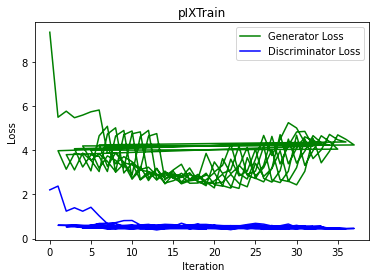

[Epoch 7/200] [Batch 13] [D loss: 0.468693, acc:  56%] [G loss: 2.539390] time: 0:03:34.417533


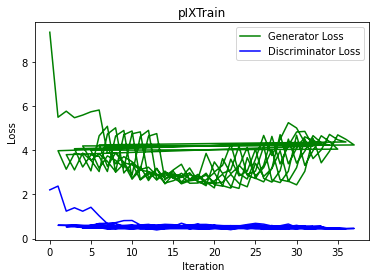

[Epoch 7/200] [Batch 14] [D loss: 0.443981, acc:  58%] [G loss: 2.490196] time: 0:03:34.907933


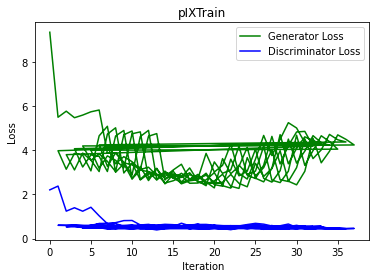

[Epoch 7/200] [Batch 15] [D loss: 0.491900, acc:  59%] [G loss: 2.597530] time: 0:03:35.392213


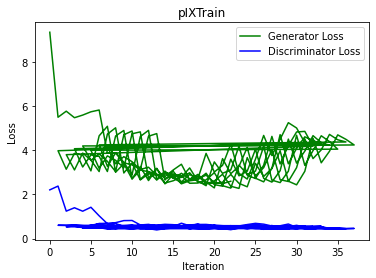

[Epoch 7/200] [Batch 16] [D loss: 0.440705, acc:  65%] [G loss: 2.910966] time: 0:03:35.895592


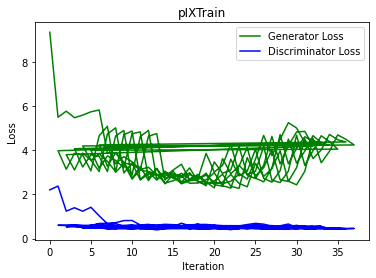

[Epoch 7/200] [Batch 17] [D loss: 0.477327, acc:  55%] [G loss: 2.542305] time: 0:03:36.385232


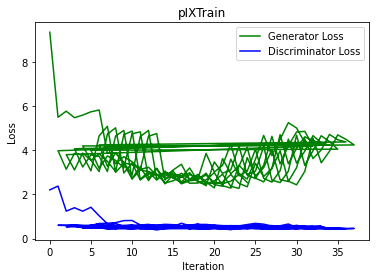

[Epoch 7/200] [Batch 18] [D loss: 0.445466, acc:  60%] [G loss: 2.271878] time: 0:03:36.867366


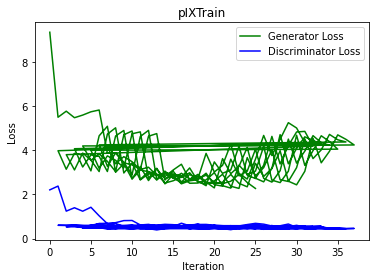

[Epoch 7/200] [Batch 19] [D loss: 0.453559, acc:  59%] [G loss: 3.341398] time: 0:03:37.355738


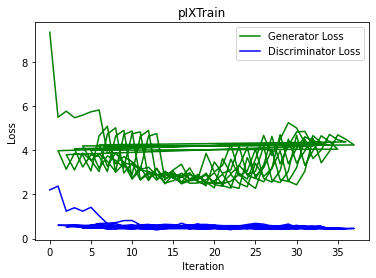

[Epoch 7/200] [Batch 20] [D loss: 0.469754, acc:  59%] [G loss: 2.815381] time: 0:03:37.842970


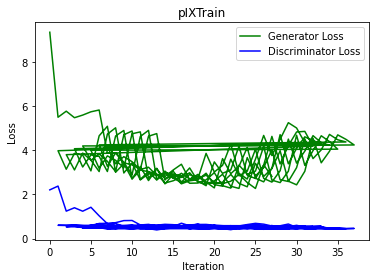

<Figure size 432x288 with 0 Axes>

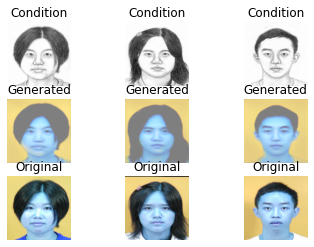

[Epoch 7/200] [Batch 21] [D loss: 0.414070, acc:  68%] [G loss: 3.202854] time: 0:03:39.695120


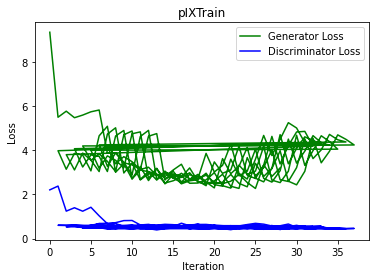

[Epoch 7/200] [Batch 22] [D loss: 0.459531, acc:  65%] [G loss: 3.895129] time: 0:03:40.333828


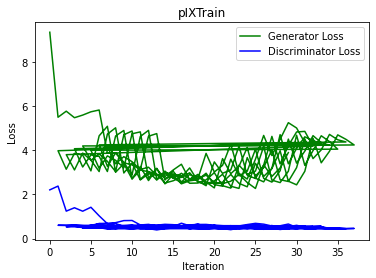

[Epoch 7/200] [Batch 23] [D loss: 0.418040, acc:  58%] [G loss: 2.576680] time: 0:03:40.820414


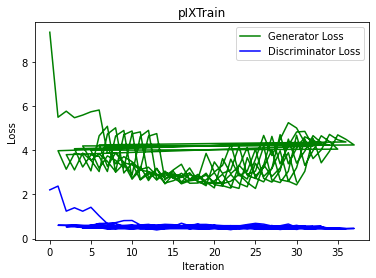

[Epoch 7/200] [Batch 24] [D loss: 0.416648, acc:  65%] [G loss: 2.391749] time: 0:03:41.304743


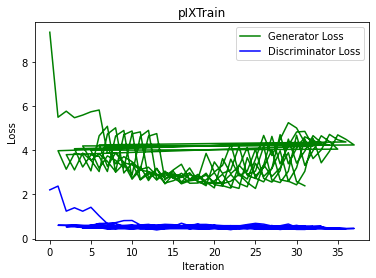

[Epoch 7/200] [Batch 25] [D loss: 0.406443, acc:  65%] [G loss: 3.052710] time: 0:03:41.796026


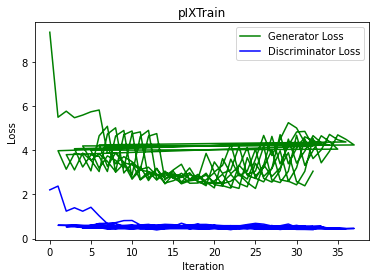

[Epoch 7/200] [Batch 26] [D loss: 0.475233, acc:  63%] [G loss: 4.502536] time: 0:03:42.278271


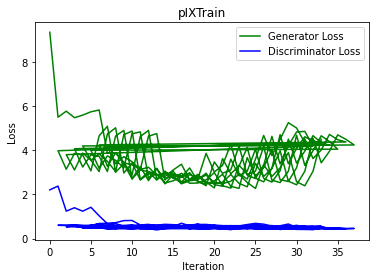

[Epoch 7/200] [Batch 27] [D loss: 0.446276, acc:  66%] [G loss: 3.478364] time: 0:03:42.769638


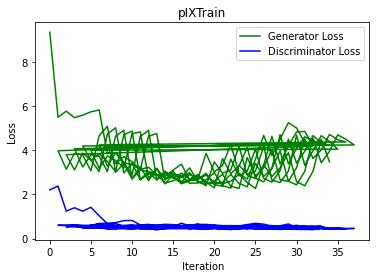

[Epoch 7/200] [Batch 28] [D loss: 0.489522, acc:  55%] [G loss: 3.990627] time: 0:03:43.260217


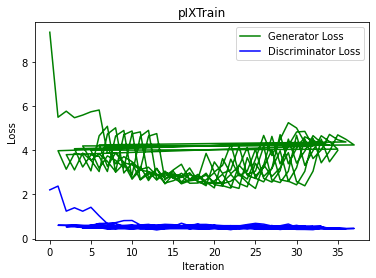

[Epoch 7/200] [Batch 29] [D loss: 0.435855, acc:  62%] [G loss: 4.627084] time: 0:03:43.749843


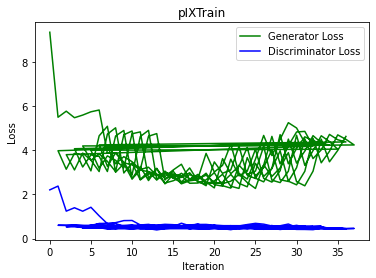

[Epoch 7/200] [Batch 30] [D loss: 0.417342, acc:  66%] [G loss: 4.480413] time: 0:03:44.238296


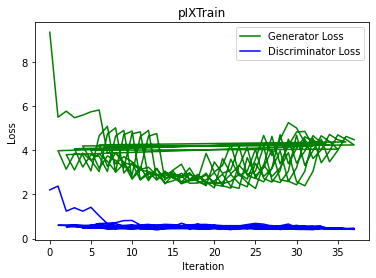

[Epoch 7/200] [Batch 31] [D loss: 0.440270, acc:  66%] [G loss: 4.120612] time: 0:03:44.722721


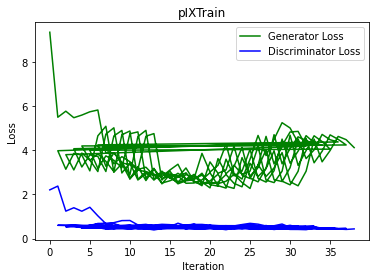

[Epoch 8/200] [Batch 0] [D loss: 0.480972, acc:  56%] [G loss: 3.929401] time: 0:03:45.214214


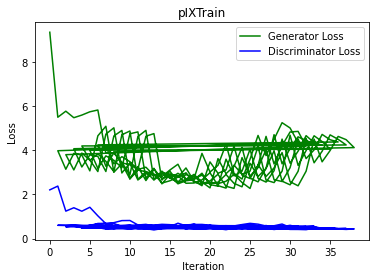

<Figure size 432x288 with 0 Axes>

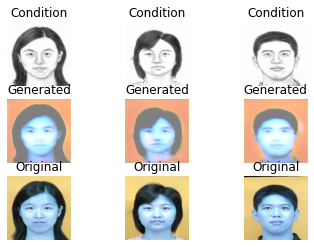

[Epoch 8/200] [Batch 1] [D loss: 0.405290, acc:  61%] [G loss: 3.141835] time: 0:03:46.755483


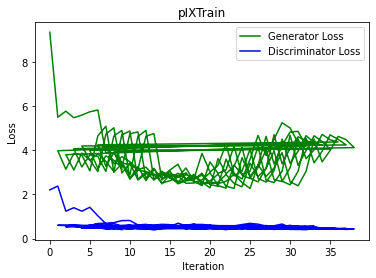

[Epoch 8/200] [Batch 2] [D loss: 0.385297, acc:  67%] [G loss: 3.645063] time: 0:03:47.247367


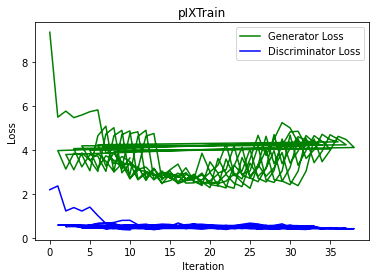

[Epoch 8/200] [Batch 3] [D loss: 0.444787, acc:  59%] [G loss: 3.554308] time: 0:03:47.742569


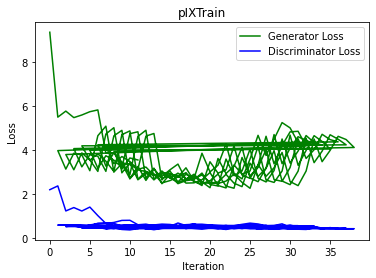

[Epoch 8/200] [Batch 4] [D loss: 0.398198, acc:  61%] [G loss: 3.049674] time: 0:03:48.241738


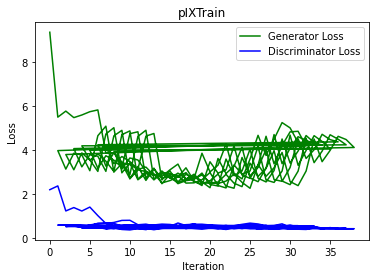

[Epoch 8/200] [Batch 5] [D loss: 0.520806, acc:  60%] [G loss: 4.571994] time: 0:03:48.734521


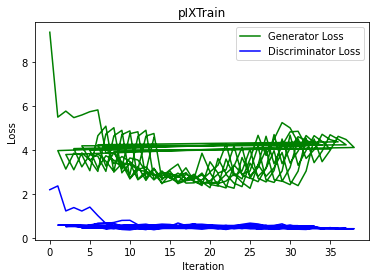

[Epoch 8/200] [Batch 6] [D loss: 0.462608, acc:  64%] [G loss: 4.711094] time: 0:03:49.224639


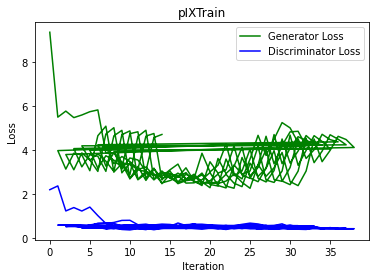

[Epoch 8/200] [Batch 7] [D loss: 0.444669, acc:  63%] [G loss: 2.700308] time: 0:03:49.727309


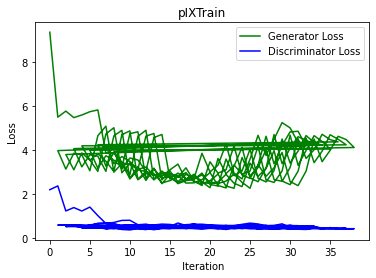

[Epoch 8/200] [Batch 8] [D loss: 0.487368, acc:  61%] [G loss: 3.083199] time: 0:03:50.219783


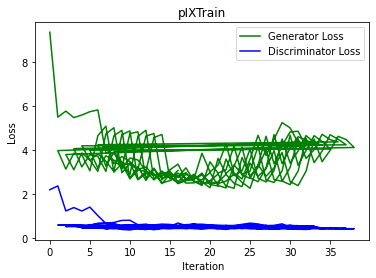

[Epoch 8/200] [Batch 9] [D loss: 0.432859, acc:  60%] [G loss: 2.582686] time: 0:03:50.709140


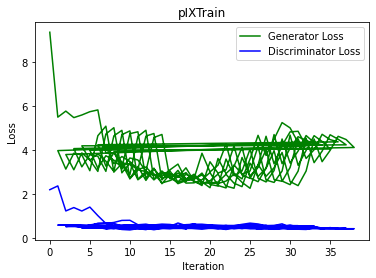

[Epoch 8/200] [Batch 10] [D loss: 0.484141, acc:  68%] [G loss: 3.013775] time: 0:03:51.196684


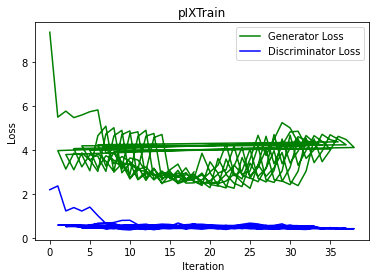

[Epoch 8/200] [Batch 11] [D loss: 0.509084, acc:  49%] [G loss: 2.668348] time: 0:03:51.831169


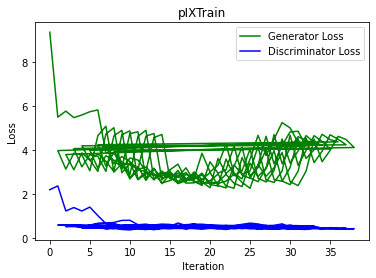

[Epoch 8/200] [Batch 12] [D loss: 0.486710, acc:  58%] [G loss: 2.782928] time: 0:03:52.319300


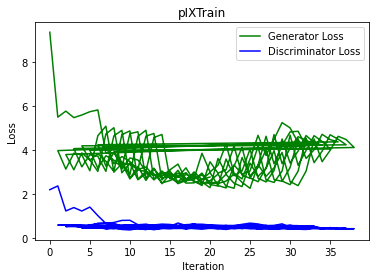

[Epoch 8/200] [Batch 13] [D loss: 0.429136, acc:  62%] [G loss: 2.505524] time: 0:03:52.806180


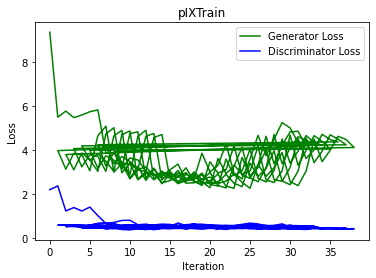

[Epoch 8/200] [Batch 14] [D loss: 0.491963, acc:  63%] [G loss: 2.642477] time: 0:03:53.312686


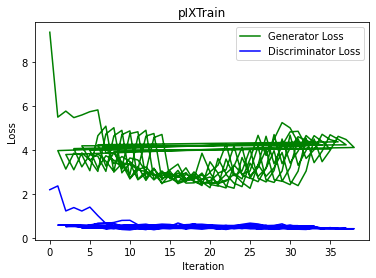

[Epoch 8/200] [Batch 15] [D loss: 0.451727, acc:  61%] [G loss: 2.539990] time: 0:03:53.803447


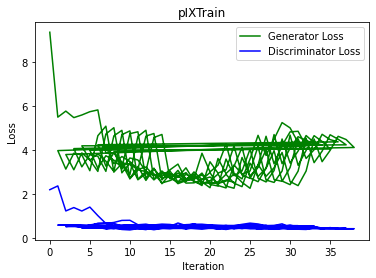

[Epoch 8/200] [Batch 16] [D loss: 0.421979, acc:  65%] [G loss: 2.871896] time: 0:03:54.296569


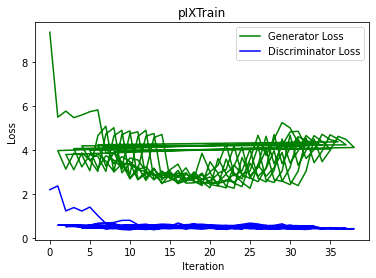

[Epoch 8/200] [Batch 17] [D loss: 0.397753, acc:  61%] [G loss: 2.459798] time: 0:03:54.795694


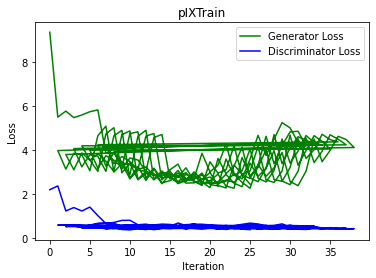

[Epoch 8/200] [Batch 18] [D loss: 0.448131, acc:  55%] [G loss: 2.276466] time: 0:03:55.286586


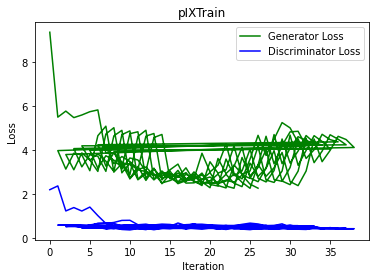

[Epoch 8/200] [Batch 19] [D loss: 0.495917, acc:  67%] [G loss: 3.533772] time: 0:03:55.780569


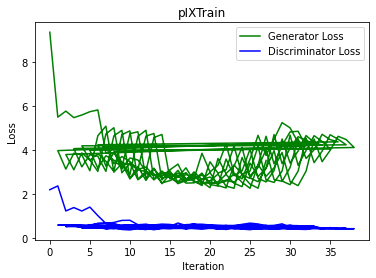

[Epoch 8/200] [Batch 20] [D loss: 0.492040, acc:  53%] [G loss: 2.753497] time: 0:03:56.268857


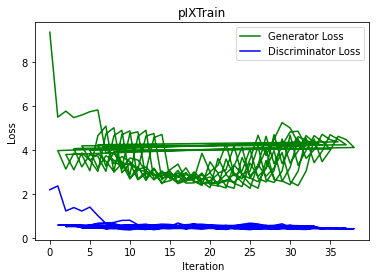

<Figure size 432x288 with 0 Axes>

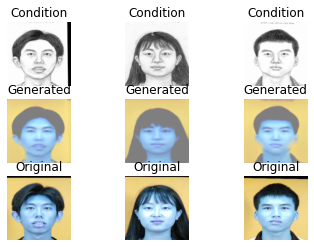

[Epoch 8/200] [Batch 21] [D loss: 0.427400, acc:  64%] [G loss: 3.124048] time: 0:03:57.818737


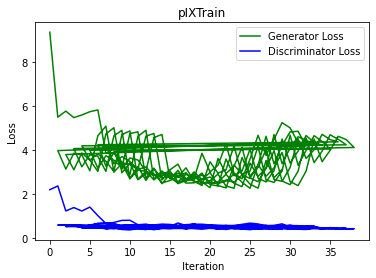

[Epoch 8/200] [Batch 22] [D loss: 0.445426, acc:  65%] [G loss: 3.887446] time: 0:03:58.306023


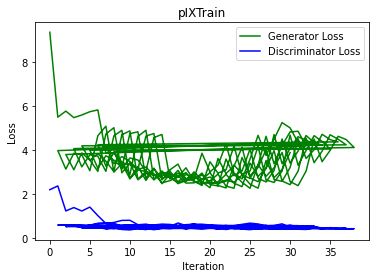

[Epoch 8/200] [Batch 23] [D loss: 0.432983, acc:  64%] [G loss: 2.635060] time: 0:03:58.796586


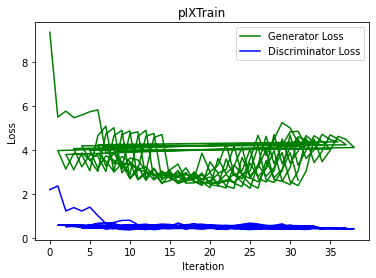

[Epoch 8/200] [Batch 24] [D loss: 0.482922, acc:  59%] [G loss: 2.451833] time: 0:03:59.284030


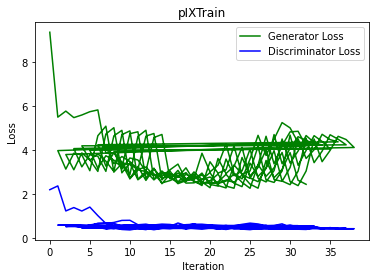

[Epoch 8/200] [Batch 25] [D loss: 0.415631, acc:  64%] [G loss: 3.049180] time: 0:03:59.772882


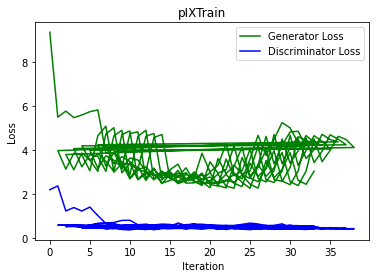

[Epoch 8/200] [Batch 26] [D loss: 0.418422, acc:  65%] [G loss: 4.544987] time: 0:04:00.281044


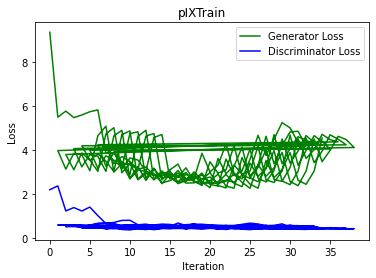

[Epoch 8/200] [Batch 27] [D loss: 0.471549, acc:  67%] [G loss: 3.547696] time: 0:04:00.768177


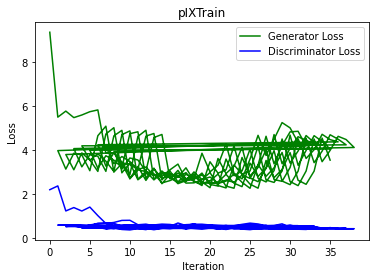

[Epoch 8/200] [Batch 28] [D loss: 0.462437, acc:  55%] [G loss: 3.823032] time: 0:04:01.253469


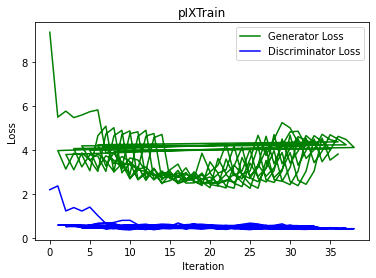

[Epoch 8/200] [Batch 29] [D loss: 0.464450, acc:  62%] [G loss: 4.546061] time: 0:04:01.753439


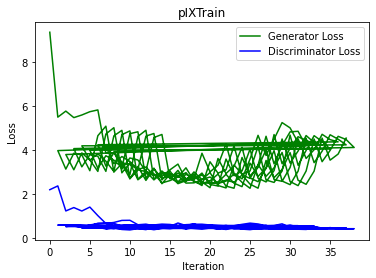

[Epoch 8/200] [Batch 30] [D loss: 0.429817, acc:  62%] [G loss: 4.388246] time: 0:04:02.241477


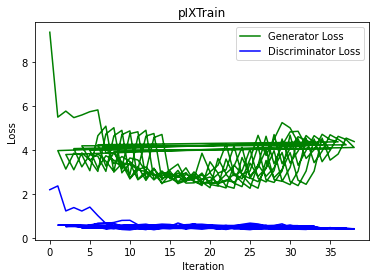

[Epoch 8/200] [Batch 31] [D loss: 0.441348, acc:  67%] [G loss: 4.051675] time: 0:04:02.728613


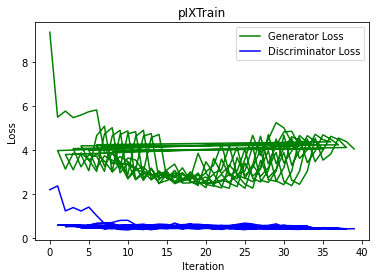

[Epoch 9/200] [Batch 0] [D loss: 0.491136, acc:  55%] [G loss: 3.978655] time: 0:04:03.361860


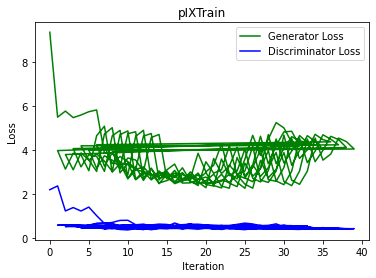

<Figure size 432x288 with 0 Axes>

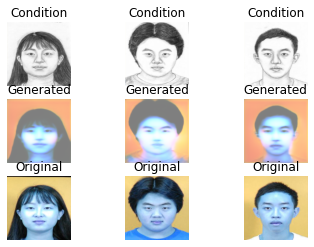

[Epoch 9/200] [Batch 1] [D loss: 0.401005, acc:  63%] [G loss: 3.201946] time: 0:04:04.268536


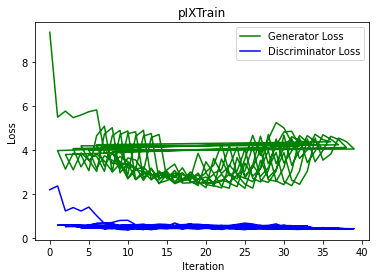

[Epoch 9/200] [Batch 2] [D loss: 0.432355, acc:  66%] [G loss: 3.574295] time: 0:04:04.763529


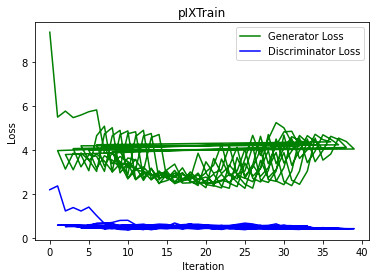

[Epoch 9/200] [Batch 3] [D loss: 0.427662, acc:  66%] [G loss: 3.478122] time: 0:04:05.256474


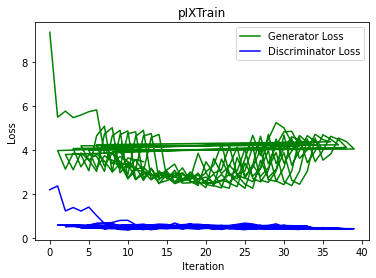

[Epoch 9/200] [Batch 4] [D loss: 0.399632, acc:  64%] [G loss: 2.943940] time: 0:04:05.750378


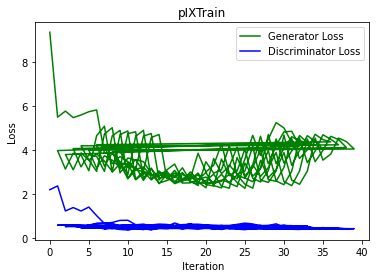

[Epoch 9/200] [Batch 5] [D loss: 0.464616, acc:  68%] [G loss: 4.690436] time: 0:04:06.237611


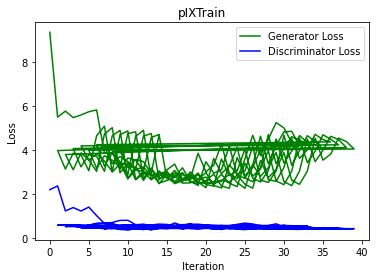

[Epoch 9/200] [Batch 6] [D loss: 0.465687, acc:  58%] [G loss: 4.887237] time: 0:04:06.729888


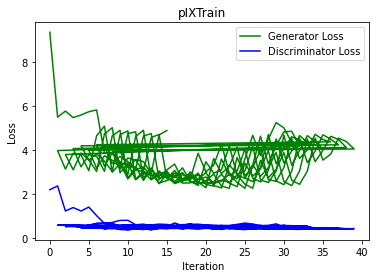

[Epoch 9/200] [Batch 7] [D loss: 0.410651, acc:  57%] [G loss: 2.724240] time: 0:04:07.231017


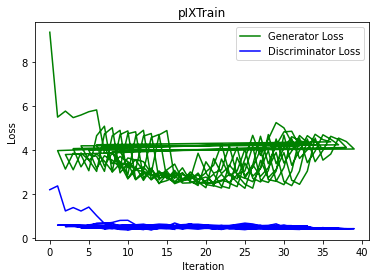

[Epoch 9/200] [Batch 8] [D loss: 0.477053, acc:  58%] [G loss: 3.095858] time: 0:04:07.717532


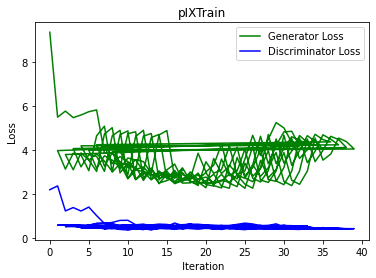

[Epoch 9/200] [Batch 9] [D loss: 0.431931, acc:  60%] [G loss: 2.669296] time: 0:04:08.222732


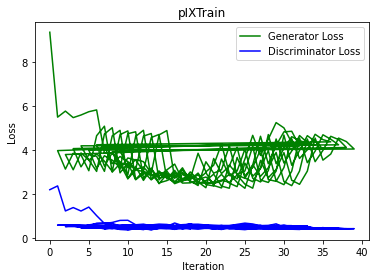

[Epoch 9/200] [Batch 10] [D loss: 0.459179, acc:  57%] [G loss: 2.862865] time: 0:04:08.710398


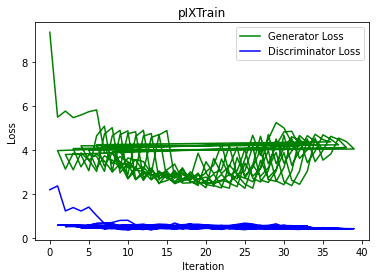

[Epoch 9/200] [Batch 11] [D loss: 0.490186, acc:  61%] [G loss: 2.701759] time: 0:04:09.202829


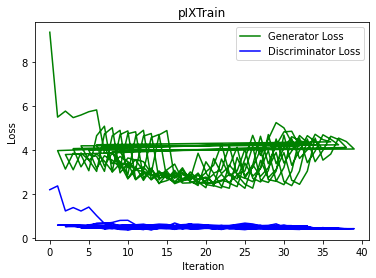

[Epoch 9/200] [Batch 12] [D loss: 0.458602, acc:  64%] [G loss: 2.774461] time: 0:04:09.690853


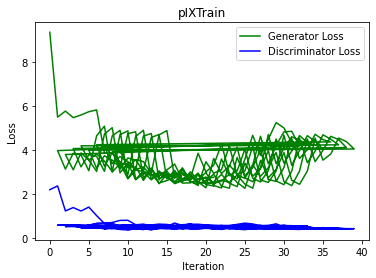

[Epoch 9/200] [Batch 13] [D loss: 0.425042, acc:  69%] [G loss: 2.603683] time: 0:04:10.177506


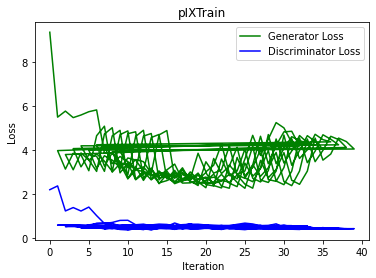

[Epoch 9/200] [Batch 14] [D loss: 0.509462, acc:  55%] [G loss: 2.352497] time: 0:04:10.670102


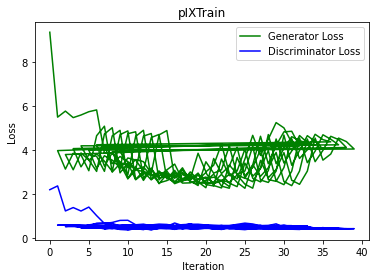

[Epoch 9/200] [Batch 15] [D loss: 0.403333, acc:  59%] [G loss: 2.570755] time: 0:04:11.162934


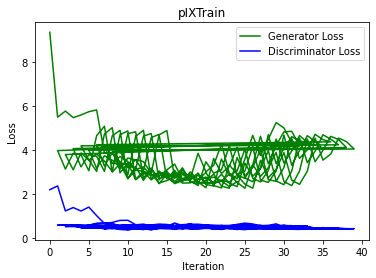

[Epoch 9/200] [Batch 16] [D loss: 0.456179, acc:  66%] [G loss: 2.873992] time: 0:04:11.660642


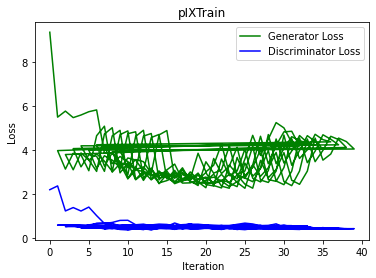

[Epoch 9/200] [Batch 17] [D loss: 0.525792, acc:  54%] [G loss: 2.435378] time: 0:04:12.156262


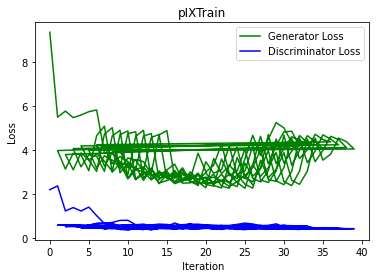

[Epoch 9/200] [Batch 18] [D loss: 0.469817, acc:  60%] [G loss: 2.307179] time: 0:04:12.646558


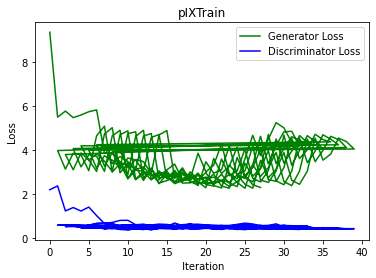

[Epoch 9/200] [Batch 19] [D loss: 0.407097, acc:  61%] [G loss: 3.340986] time: 0:04:13.134630


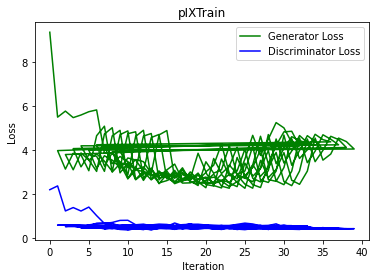

[Epoch 9/200] [Batch 20] [D loss: 0.485295, acc:  60%] [G loss: 2.918386] time: 0:04:13.759250


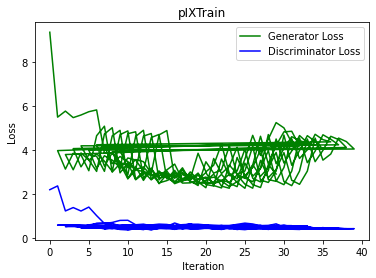

<Figure size 432x288 with 0 Axes>

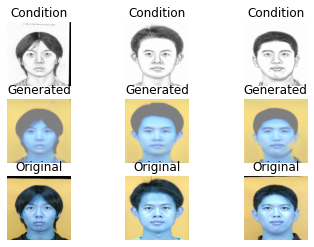

[Epoch 9/200] [Batch 21] [D loss: 0.395075, acc:  64%] [G loss: 3.119332] time: 0:04:15.287331


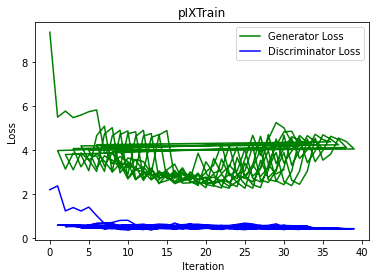

[Epoch 9/200] [Batch 22] [D loss: 0.419323, acc:  65%] [G loss: 3.765796] time: 0:04:15.794503


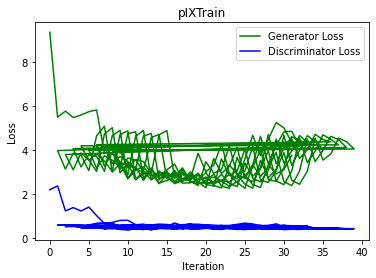

[Epoch 9/200] [Batch 23] [D loss: 0.455623, acc:  61%] [G loss: 2.599245] time: 0:04:16.286850


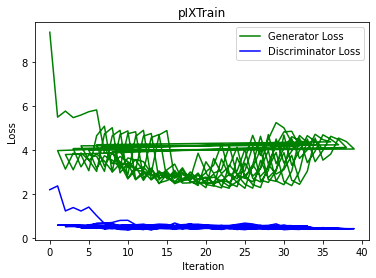

[Epoch 9/200] [Batch 24] [D loss: 0.419090, acc:  67%] [G loss: 2.381664] time: 0:04:16.778852


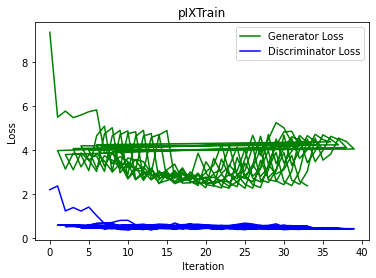

[Epoch 9/200] [Batch 25] [D loss: 0.415545, acc:  58%] [G loss: 3.101518] time: 0:04:17.273384


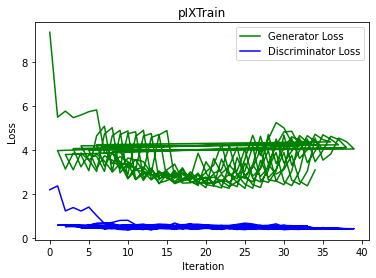

[Epoch 9/200] [Batch 26] [D loss: 0.398509, acc:  67%] [G loss: 4.419761] time: 0:04:17.768536


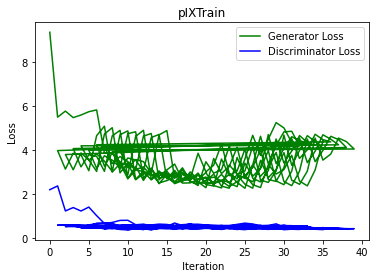

[Epoch 9/200] [Batch 27] [D loss: 0.432224, acc:  65%] [G loss: 3.513061] time: 0:04:18.261882


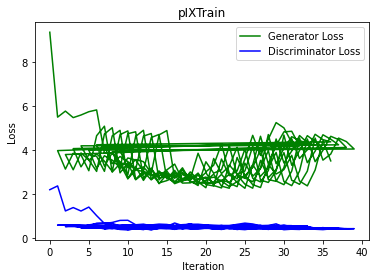

[Epoch 9/200] [Batch 28] [D loss: 0.441964, acc:  62%] [G loss: 3.907624] time: 0:04:18.761327


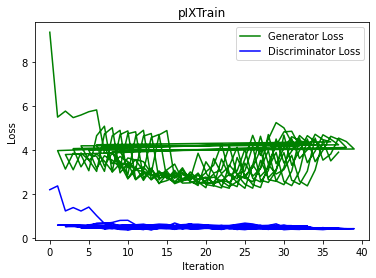

[Epoch 9/200] [Batch 29] [D loss: 0.470481, acc:  63%] [G loss: 4.618187] time: 0:04:19.253146


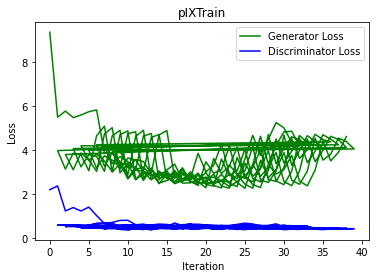

[Epoch 9/200] [Batch 30] [D loss: 0.395283, acc:  64%] [G loss: 4.427745] time: 0:04:19.747864


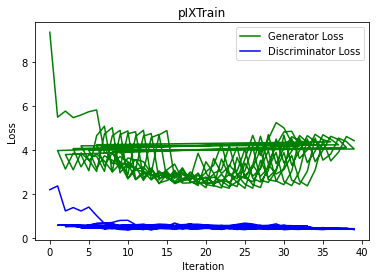

[Epoch 9/200] [Batch 31] [D loss: 0.445341, acc:  62%] [G loss: 4.123082] time: 0:04:20.250602


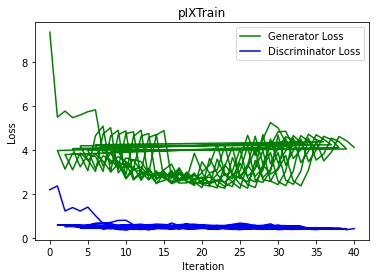

[Epoch 10/200] [Batch 0] [D loss: 0.445356, acc:  60%] [G loss: 4.018871] time: 0:04:20.746726


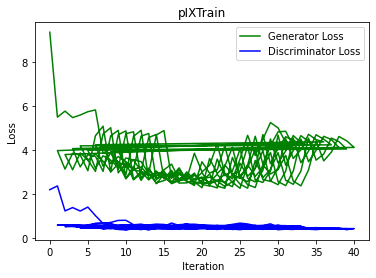

<Figure size 432x288 with 0 Axes>

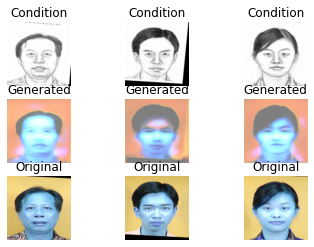

[Epoch 10/200] [Batch 1] [D loss: 0.390919, acc:  64%] [G loss: 3.279620] time: 0:04:22.311847


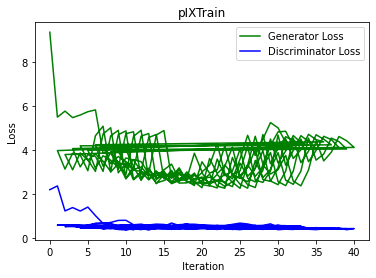

[Epoch 10/200] [Batch 2] [D loss: 0.438055, acc:  69%] [G loss: 3.650109] time: 0:04:22.805472


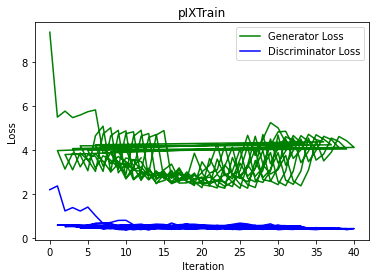

[Epoch 10/200] [Batch 3] [D loss: 0.454778, acc:  65%] [G loss: 3.373100] time: 0:04:23.445544


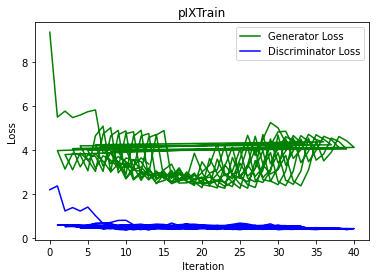

[Epoch 10/200] [Batch 4] [D loss: 0.418076, acc:  66%] [G loss: 2.834606] time: 0:04:23.936425


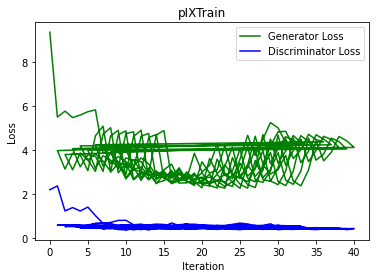

[Epoch 10/200] [Batch 5] [D loss: 0.475495, acc:  73%] [G loss: 4.807358] time: 0:04:24.433648


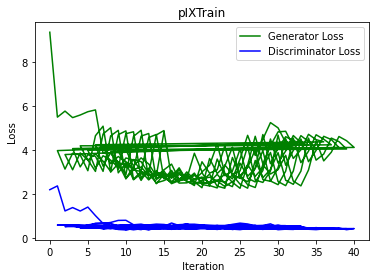

[Epoch 10/200] [Batch 6] [D loss: 0.499820, acc:  57%] [G loss: 4.830123] time: 0:04:24.927266


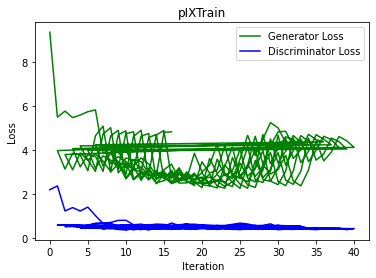

[Epoch 10/200] [Batch 7] [D loss: 0.437461, acc:  60%] [G loss: 2.651558] time: 0:04:25.419871


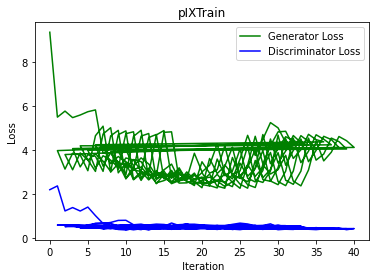

[Epoch 10/200] [Batch 8] [D loss: 0.435056, acc:  54%] [G loss: 3.023656] time: 0:04:25.911295


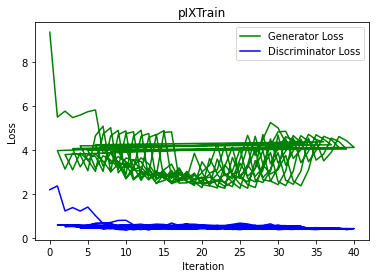

[Epoch 10/200] [Batch 9] [D loss: 0.502747, acc:  62%] [G loss: 2.540365] time: 0:04:26.406876


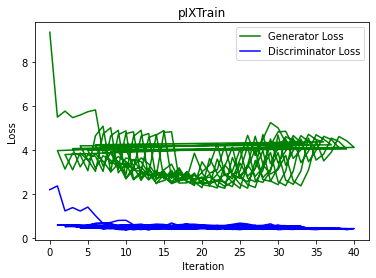

[Epoch 10/200] [Batch 10] [D loss: 0.458393, acc:  63%] [G loss: 2.768099] time: 0:04:26.895887


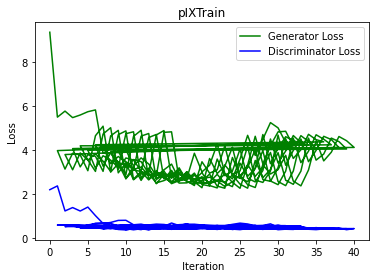

[Epoch 10/200] [Batch 11] [D loss: 0.456594, acc:  63%] [G loss: 2.743242] time: 0:04:27.385905


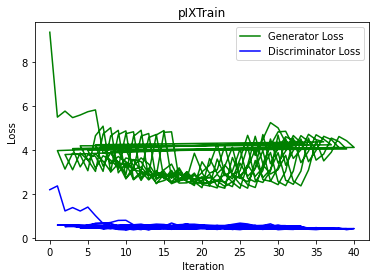

[Epoch 10/200] [Batch 12] [D loss: 0.421004, acc:  63%] [G loss: 2.789851] time: 0:04:27.875153


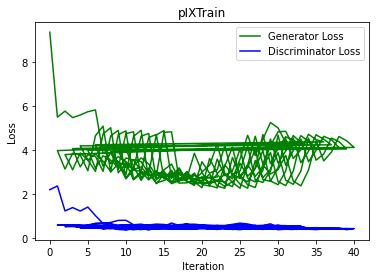

[Epoch 10/200] [Batch 13] [D loss: 0.455631, acc:  63%] [G loss: 2.672984] time: 0:04:28.367261


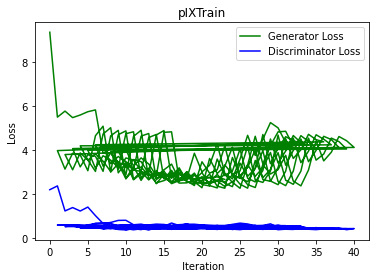

[Epoch 10/200] [Batch 14] [D loss: 0.449383, acc:  61%] [G loss: 2.412741] time: 0:04:28.857904


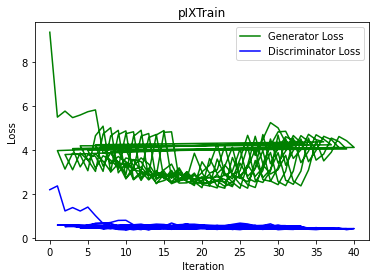

[Epoch 10/200] [Batch 15] [D loss: 0.399221, acc:  61%] [G loss: 2.542500] time: 0:04:29.350078


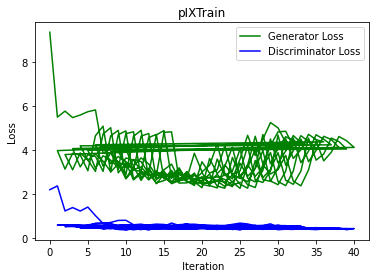

[Epoch 10/200] [Batch 16] [D loss: 0.416103, acc:  69%] [G loss: 3.000696] time: 0:04:29.840360


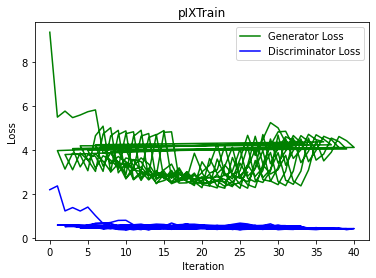

[Epoch 10/200] [Batch 17] [D loss: 0.420770, acc:  62%] [G loss: 2.450868] time: 0:04:30.325404


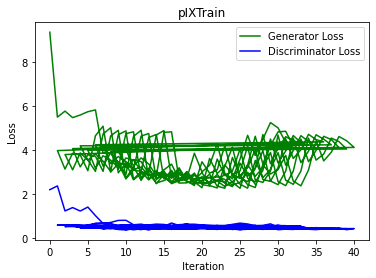

[Epoch 10/200] [Batch 18] [D loss: 0.422738, acc:  60%] [G loss: 2.338400] time: 0:04:30.819820


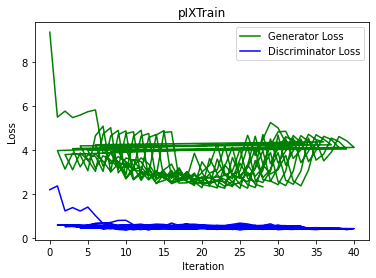

[Epoch 10/200] [Batch 19] [D loss: 0.431789, acc:  61%] [G loss: 3.339971] time: 0:04:31.306827


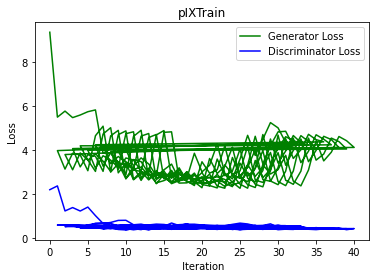

[Epoch 10/200] [Batch 20] [D loss: 0.418492, acc:  62%] [G loss: 2.858020] time: 0:04:31.803647


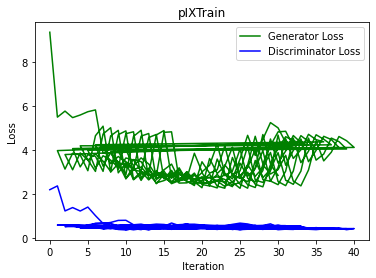

<Figure size 432x288 with 0 Axes>

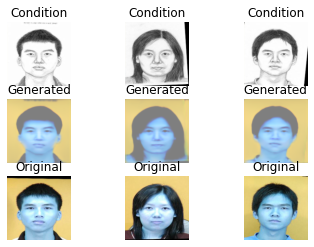

[Epoch 10/200] [Batch 21] [D loss: 0.431311, acc:  66%] [G loss: 3.102178] time: 0:04:33.860592


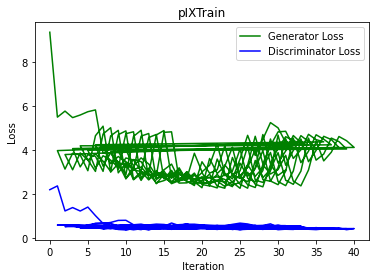

[Epoch 10/200] [Batch 22] [D loss: 0.365579, acc:  64%] [G loss: 3.949477] time: 0:04:34.360705


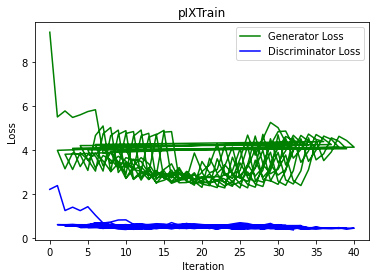

[Epoch 10/200] [Batch 23] [D loss: 0.444272, acc:  65%] [G loss: 2.637252] time: 0:04:34.989806


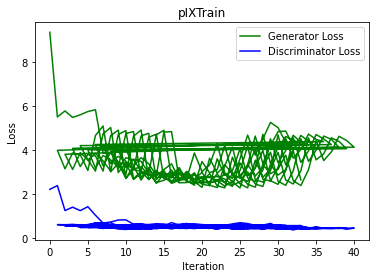

[Epoch 10/200] [Batch 24] [D loss: 0.442066, acc:  61%] [G loss: 2.419453] time: 0:04:35.481975


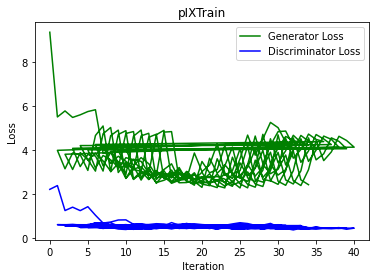

[Epoch 10/200] [Batch 25] [D loss: 0.412672, acc:  62%] [G loss: 3.030366] time: 0:04:35.976365


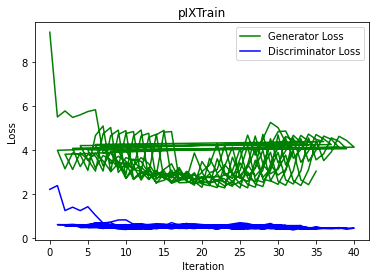

[Epoch 10/200] [Batch 26] [D loss: 0.428307, acc:  65%] [G loss: 4.456466] time: 0:04:36.468980


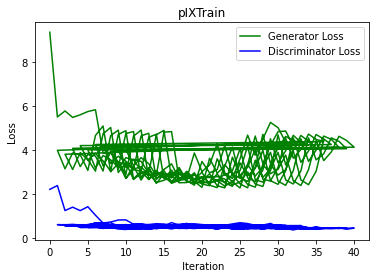

[Epoch 10/200] [Batch 27] [D loss: 0.409170, acc:  64%] [G loss: 3.449244] time: 0:04:36.958992


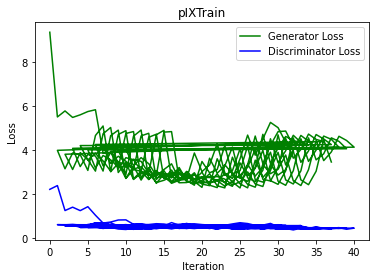

[Epoch 10/200] [Batch 28] [D loss: 0.396507, acc:  66%] [G loss: 3.889931] time: 0:04:37.457332


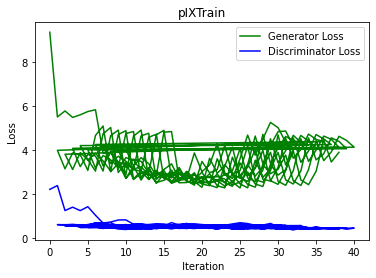

[Epoch 10/200] [Batch 29] [D loss: 0.459842, acc:  66%] [G loss: 4.589680] time: 0:04:37.947111


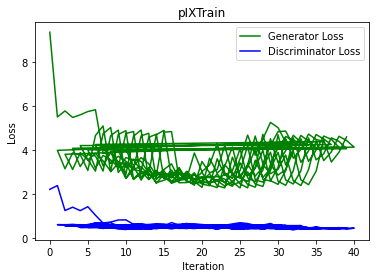

[Epoch 10/200] [Batch 30] [D loss: 0.432402, acc:  64%] [G loss: 4.381953] time: 0:04:38.436653


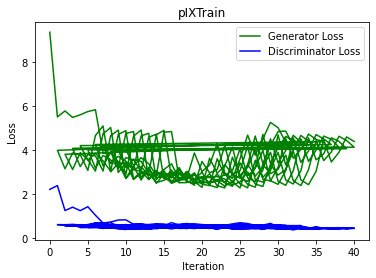

[Epoch 10/200] [Batch 31] [D loss: 0.404780, acc:  68%] [G loss: 3.896616] time: 0:04:38.929732


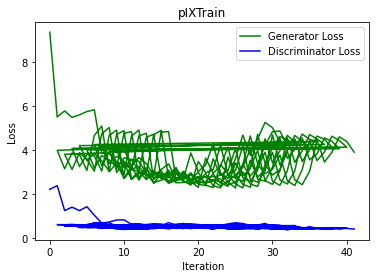

[Epoch 11/200] [Batch 0] [D loss: 0.474970, acc:  60%] [G loss: 3.712357] time: 0:04:39.411993


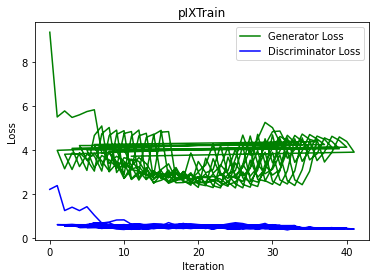

<Figure size 432x288 with 0 Axes>

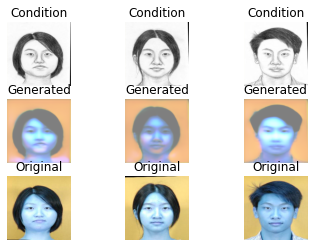

[Epoch 11/200] [Batch 1] [D loss: 0.392111, acc:  65%] [G loss: 3.064517] time: 0:04:42.442008


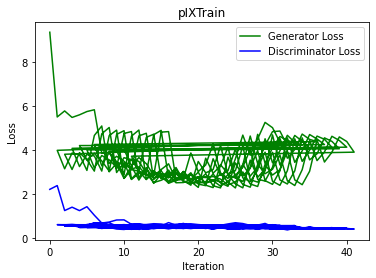

[Epoch 11/200] [Batch 2] [D loss: 0.388887, acc:  67%] [G loss: 3.601845] time: 0:04:42.923709


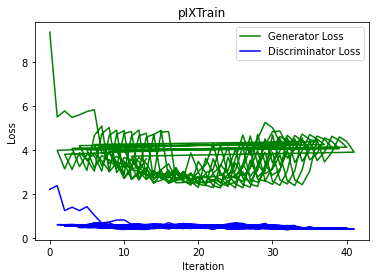

[Epoch 11/200] [Batch 3] [D loss: 0.390541, acc:  67%] [G loss: 3.478486] time: 0:04:43.401016


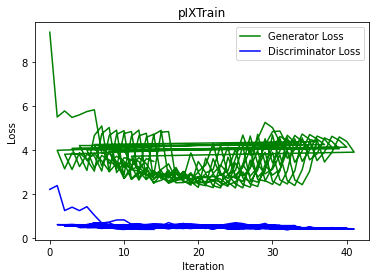

[Epoch 11/200] [Batch 4] [D loss: 0.443723, acc:  62%] [G loss: 2.880408] time: 0:04:43.882604


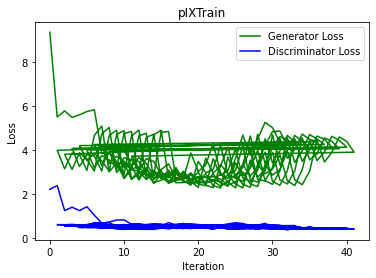

[Epoch 11/200] [Batch 5] [D loss: 0.348086, acc:  71%] [G loss: 4.689865] time: 0:04:44.360852


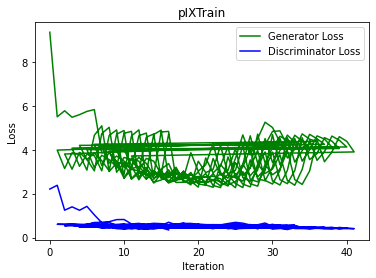

[Epoch 11/200] [Batch 6] [D loss: 0.408489, acc:  69%] [G loss: 4.818425] time: 0:04:44.848868


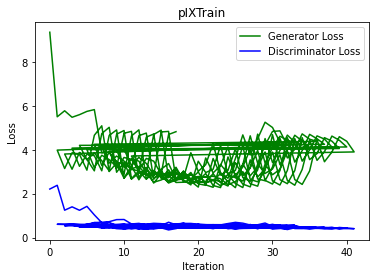

[Epoch 11/200] [Batch 7] [D loss: 0.473183, acc:  59%] [G loss: 2.726949] time: 0:04:45.324462


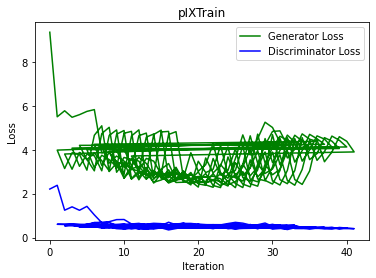

[Epoch 11/200] [Batch 8] [D loss: 0.430175, acc:  59%] [G loss: 3.034072] time: 0:04:45.802898


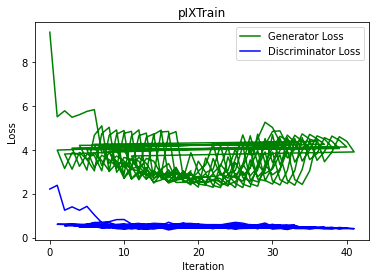

[Epoch 11/200] [Batch 9] [D loss: 0.414557, acc:  60%] [G loss: 2.486856] time: 0:04:46.278654


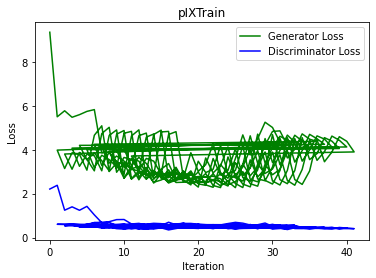

[Epoch 11/200] [Batch 10] [D loss: 0.424534, acc:  59%] [G loss: 2.815890] time: 0:04:46.758849


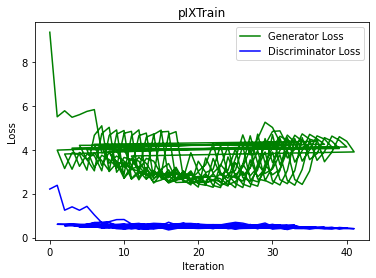

[Epoch 11/200] [Batch 11] [D loss: 0.438290, acc:  61%] [G loss: 2.684392] time: 0:04:47.242971


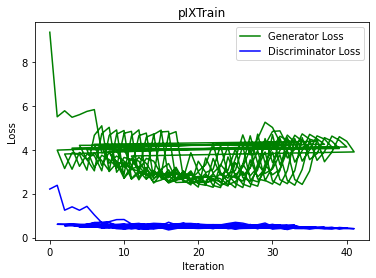

[Epoch 11/200] [Batch 12] [D loss: 0.409862, acc:  63%] [G loss: 2.752434] time: 0:04:47.873175


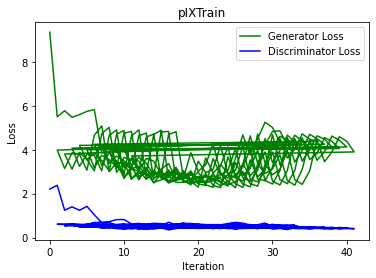

[Epoch 11/200] [Batch 13] [D loss: 0.387816, acc:  64%] [G loss: 2.578363] time: 0:04:48.348218


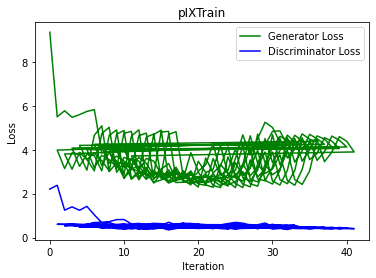

[Epoch 11/200] [Batch 14] [D loss: 0.468463, acc:  61%] [G loss: 2.448909] time: 0:04:48.828604


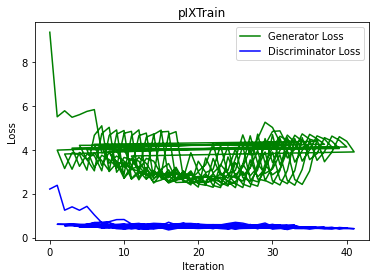

[Epoch 11/200] [Batch 15] [D loss: 0.405276, acc:  66%] [G loss: 2.596577] time: 0:04:49.305358


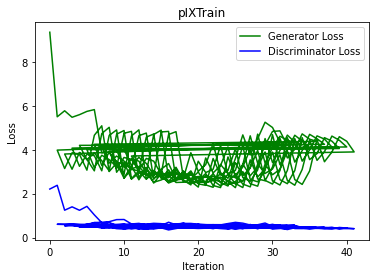

[Epoch 11/200] [Batch 16] [D loss: 0.409167, acc:  65%] [G loss: 2.879212] time: 0:04:49.789424


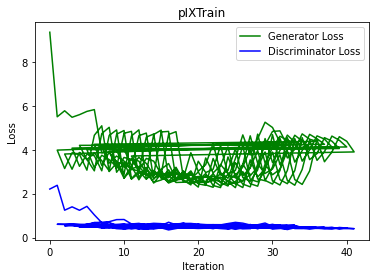

[Epoch 11/200] [Batch 17] [D loss: 0.397527, acc:  66%] [G loss: 2.521345] time: 0:04:50.272411


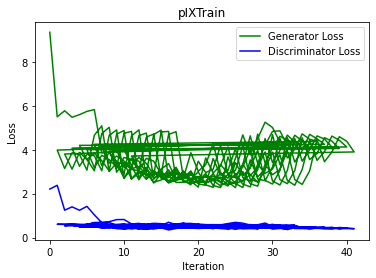

[Epoch 11/200] [Batch 18] [D loss: 0.418535, acc:  61%] [G loss: 2.293862] time: 0:04:50.748018


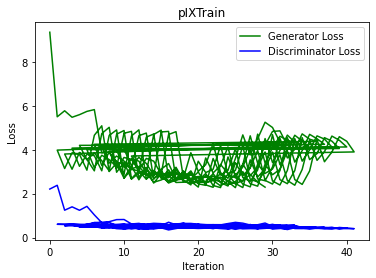

[Epoch 11/200] [Batch 19] [D loss: 0.418307, acc:  64%] [G loss: 3.393735] time: 0:04:51.231697


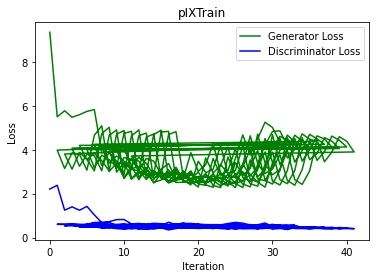

[Epoch 11/200] [Batch 20] [D loss: 0.443428, acc:  54%] [G loss: 2.806357] time: 0:04:51.721946


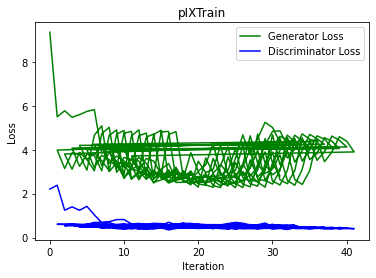

<Figure size 432x288 with 0 Axes>

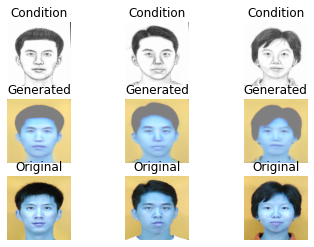

[Epoch 11/200] [Batch 21] [D loss: 0.394187, acc:  65%] [G loss: 3.128278] time: 0:04:52.608021


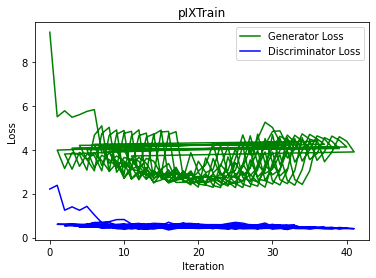

[Epoch 11/200] [Batch 22] [D loss: 0.434839, acc:  63%] [G loss: 3.750682] time: 0:04:53.091935


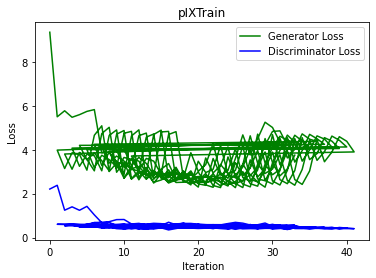

[Epoch 11/200] [Batch 23] [D loss: 0.411865, acc:  64%] [G loss: 2.638634] time: 0:04:53.572527


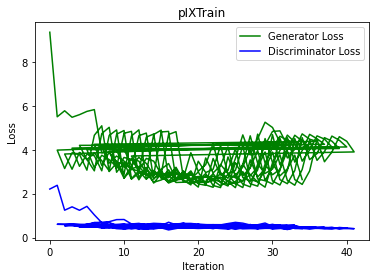

[Epoch 11/200] [Batch 24] [D loss: 0.430301, acc:  61%] [G loss: 2.463216] time: 0:04:54.048322


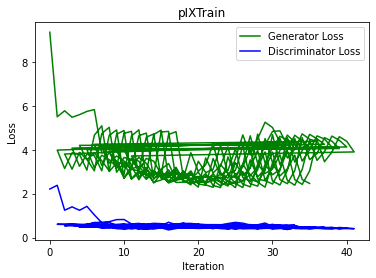

[Epoch 11/200] [Batch 25] [D loss: 0.411516, acc:  65%] [G loss: 3.023877] time: 0:04:54.526424


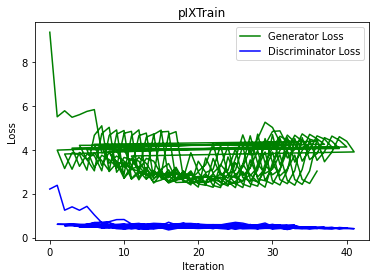

[Epoch 11/200] [Batch 26] [D loss: 0.455779, acc:  63%] [G loss: 4.373587] time: 0:04:55.009598


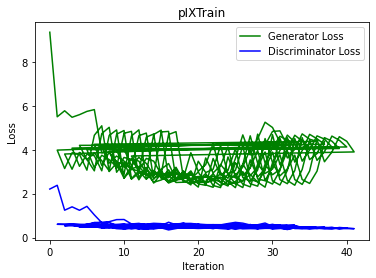

[Epoch 11/200] [Batch 27] [D loss: 0.354431, acc:  64%] [G loss: 3.321913] time: 0:04:55.494374


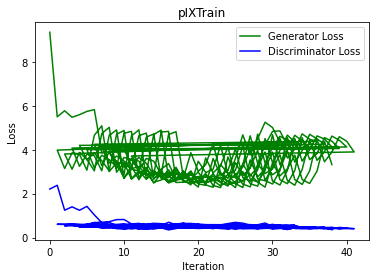

[Epoch 11/200] [Batch 28] [D loss: 0.404906, acc:  63%] [G loss: 3.808181] time: 0:04:55.980482


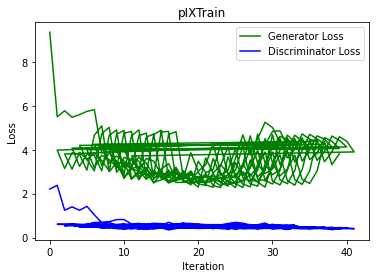

In [ ]:
train(200,3,20)

In [ ]:
""""test_model = gan.generator
test_model.load_weights("/content/drive/My Drive/SAVE/gen_model.h5")
path = glob("./datasets/facades/test/*")
#path = glob('/content/drive/My Drive/V/test/*')
num = 1
for img in path:
    img_B = scipy.misc.imread(img, mode='RGB').astype(np.float)
    m,n,d = img_B.shape
    img_show = np.zeros((m,2*n,d))

    mg_b = np.array([img_B])/127.5 - 1
    fake_A = 0.5* (test_model.predict(img_b))[0]+0.5
    img_show[:,:n,:] = img_B/255
    img_show[:,n:2*n,:] = fake_A
    scipy.misc.imsave("./images/pathology/test_random/%d.jpg" % num,img_show)
    num = num + 1"""